# Where come from 311 complaints related to housing condition
* 2015 311 complaints vs. 2015 HPD HMC housing violations

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.patches as mpatches
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pylab as pl
%matplotlib inline

In [2]:
# Load 2015 whole data set made by data cleaning steps (HPD HMC violation and 311 complaints related to HPD)
df_com = pd.read_csv('data/hpd_complaints_2015', parse_dates = ['Created Date'], dtype={'Incident Zip': str})
df_vio = pd.read_csv('data/hpd_violations_2015', parse_dates = ['InspectionDate'], 
                     dtype={'ViolationID': str, 'BuildingID': str, 'RegistrationID': str, 'BoroID': str, 
                            'ZIPCODE': str, 'Block':str, 'Lot':str, 'BBL': str, 'OrderNumber':str})
df_com = df_com.rename(columns={'Incident Zip': 'ZIPCODE'})


# Load 2014 whole data set made by data cleaning steps (HPD HMC violation and 311 complaints related to HPD)
df_com_2014 = pd.read_csv('data/hpd_complaints_2014', parse_dates = ['Created Date'], dtype={'Incident Zip': str})
df_vio_2014 = pd.read_csv('data/hpd_violations_2014', parse_dates = ['InspectionDate'], 
                     dtype={'ViolationID': str, 'BuildingID': str, 'RegistrationID': str, 'BoroID': str, 
                            'ZIPCODE': str, 'Block':str, 'Lot':str, 'BBL': str, 'OrderNumber':str})
df_com_2014 = df_com_2014.rename(columns={'Incident Zip': 'ZIPCODE'})

/Users/bh1555/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
#df_com.head(1)

In [4]:
#df_vio.head(1)

In [5]:
# The number of HPD HMC violations and complaints between 09/01/2016 and 09/30/2016
print 'Total 2015 Violation : ', len(df_vio)
print 'Total 2015 Complaints : ', len(df_com)
print 'Total 2014 Violation : ', len(df_vio_2014)
print 'Total 2014 Complaints : ', len(df_com_2014)
print ' '

# The number of each class of violations (A, B, or C)
print '<<<< The number of violations by class (2015) >>>>'
print df_vio['Class'].value_counts()
print ' '
# The number of each class of violations (A, B, or C)
print '<<<< The number of violations by class (2014) >>>>'
print df_vio_2014['Class'].value_counts()
print ' '


# The number of each type of complaints 
print '<<<< The number of complatins by type (2015) >>>>'
print df_com['Complaint Type'].value_counts()
print ' '
# The number of each type of complaints 
print '<<<< The number of complatins by type (2014) >>>>'
print df_com_2014['Complaint Type'].value_counts()
print ' '

Total 2015 Violation :  550278
Total 2015 Complaints :  629352
Total 2014 Violation :  279582
Total 2014 Complaints :  613226
 
<<<< The number of violations by class (2015) >>>>
B    250046
I    114216
A     95108
C     90908
Name: Class, dtype: int64
 
<<<< The number of violations by class (2014) >>>>
B    171377
C     56184
A     51244
I       777
Name: Class, dtype: int64
 
<<<< The number of complatins by type (2015) >>>>
HEAT/HOT WATER            225706
UNSANITARY CONDITION       82888
PAINT/PLASTER              69698
PLUMBING                   55418
DOOR/WINDOW                40005
WATER LEAK                 35570
ELECTRIC                   30133
FLOORING/STAIRS            27815
GENERAL                    26755
HPD Literature Request     11498
APPLIANCE                  11238
SAFETY                      9847
OUTSIDE BUILDING            1682
ELEVATOR                    1095
VACANT APARTMENT               2
AGENCY                         1
Agency Issues                  1
Name: C

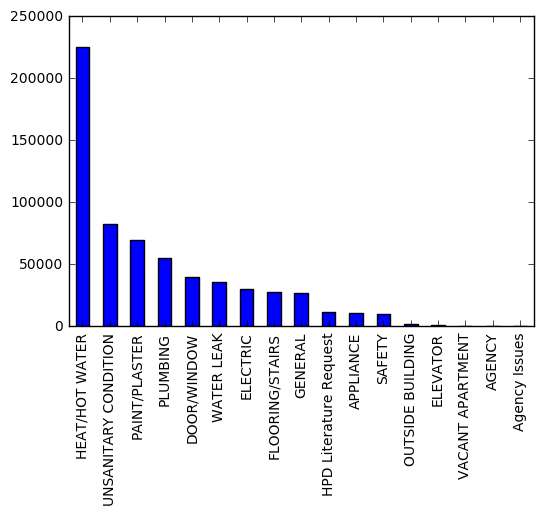

In [6]:
# Bar plot of the number of complaints by type
df_com['Complaint Type'].value_counts().plot(kind='bar')

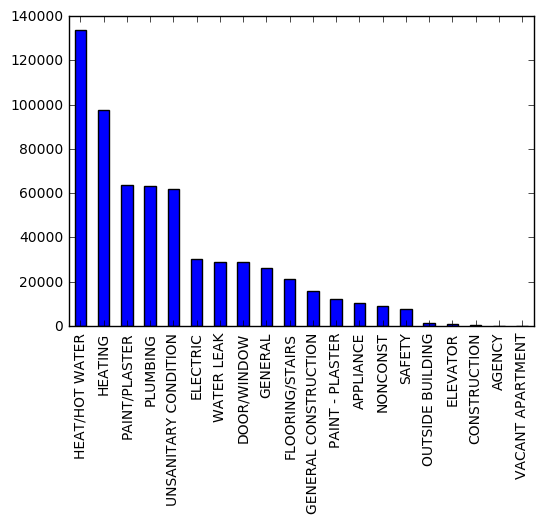

In [7]:
df_com_2014['Complaint Type'].value_counts().plot(kind='bar')

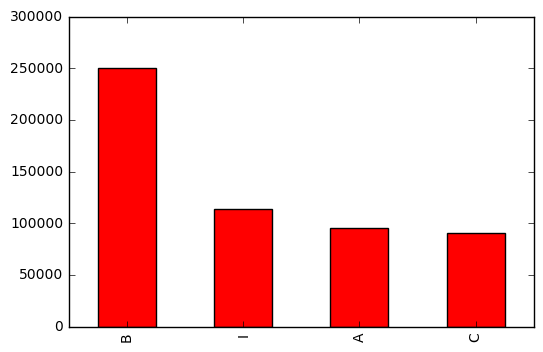

In [8]:
# Bar plot of the number of violations by class
df_vio['Class'].value_counts().plot(kind='bar', color='Red')

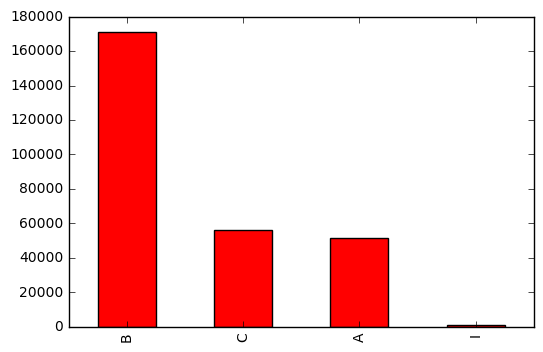

In [9]:
df_vio_2014['Class'].value_counts().plot(kind='bar', color='Red')

In [10]:
# Time series plot of 2015 complaints and violations related to HPD
df_com['Date'] = pd.DatetimeIndex(df_com['Created Date']).normalize()
df_com_2014['Date'] = pd.DatetimeIndex(df_com_2014['Created Date']).normalize()

complaints_time = df_com.groupby(['Date']).count()
violations_time = df_vio.groupby(['InspectionDate']).count()
complaints_time = complaints_time['Unique Key']
violations_time = violations_time['ViolationID']

complaints_time_2014 = df_com_2014.groupby(['Date']).count()
violations_time_2014 = df_vio_2014.groupby(['InspectionDate']).count()
complaints_time_2014 = complaints_time_2014['Unique Key']
violations_time_2014 = violations_time_2014['ViolationID']


#dataframe to array
C_array = complaints_time.as_matrix()
V_array = violations_time.as_matrix()
#print C_array
print 'Complaints days in 2015: ', len(C_array)
print 'Violations days in 2015: ', len(V_array)



#dataframe to array
C_array_2014 = complaints_time_2014.as_matrix()
V_array_2014 = violations_time_2014.as_matrix()
#print C_array
print 'Complaints days in 2014: ', len(C_array_2014)
print 'Violations days in 2014: ', len(V_array_2014)

Complaints days in 2015:  365
Violations days in 2015:  365
Complaints days in 2014:  366
Violations days in 2014:  366


/Users/bh1555/anaconda/lib/python2.7/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


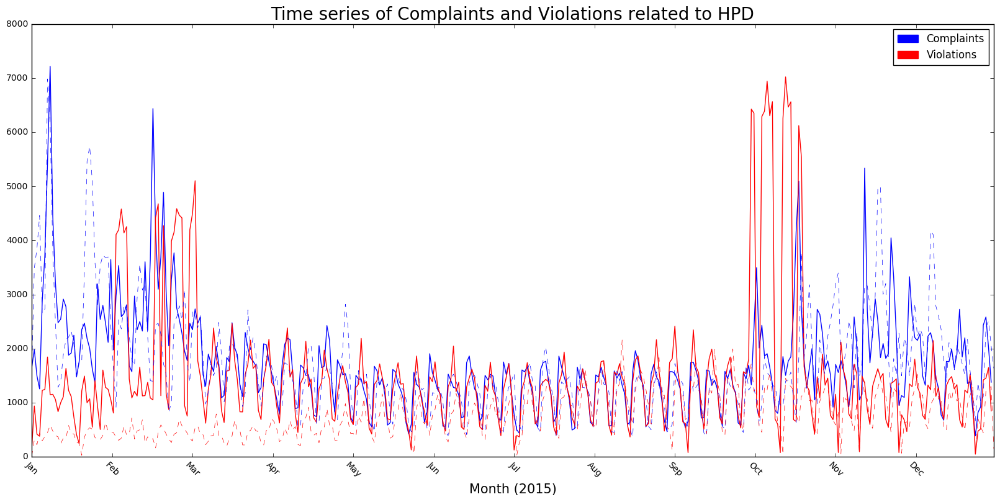

In [11]:
date_list_c = complaints_time.index.tolist()
date_list_v = violations_time.index.tolist()
date_list_c_2014 = complaints_time_2014.index.tolist()
date_list_v_2014 = violations_time_2014.index.tolist()

mylist_c = list(xrange(365))
mylist_v = list(xrange(365))
mylist_c_2014 = list(xrange(366))
mylist_v_2014 = list(xrange(366))

month_list = ['Jan', 'Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig = plt.figure(figsize=(20, 9))
plt.title('Time series of Complaints and Violations related to HPD', fontsize=20)
#plt.ylabel('Time series of Complaints and Violations related to HPD', fontsize=15)
plt.xlabel('Month (2015)', fontsize=15)
locs = np.arange(365, step=30.5) # locations
plt.xticks(locs, month_list, rotation=-45)
plt.plot(mylist_c,C_array, alpha=1, linewidth=1, c='Blue')
plt.plot(mylist_v,V_array, alpha=1, linewidth=1, c='Red')

plt.plot(mylist_c_2014,C_array_2014, alpha=1, linewidth=0.5, color='Blue', linestyle='--')
plt.plot(mylist_v_2014,V_array_2014, alpha=1, linewidth=0.5, color='Red', linestyle='--')

blue_patch = mpatches.Patch(color='blue', label='Complaints')
red_patch = mpatches.Patch(color='red', label='Violations')
plt.legend(handles=[blue_patch, red_patch])

plt.legend()
plt.show()

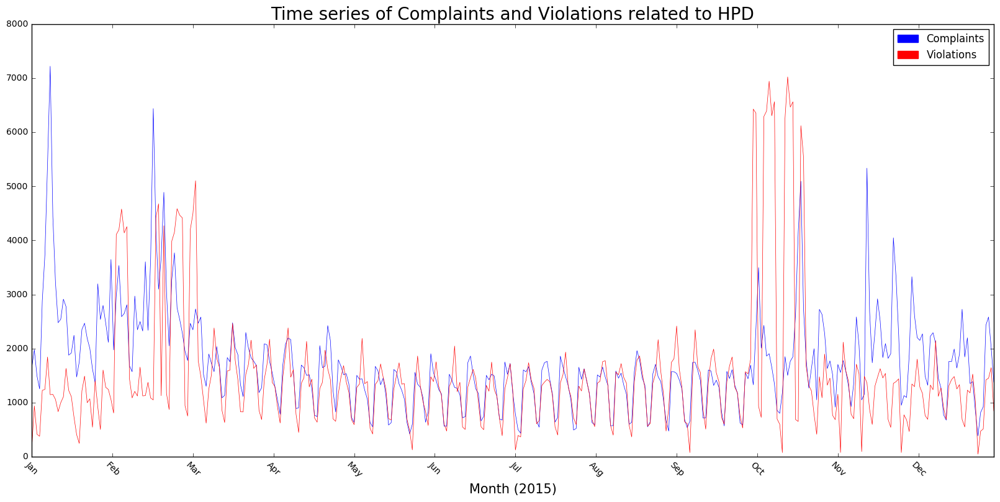

In [12]:
fig = plt.figure(figsize=(20, 9))
plt.title('Time series of Complaints and Violations related to HPD', fontsize=20)
#plt.ylabel('Time series of Complaints and Violations related to HPD', fontsize=15)
plt.xlabel('Month (2015)', fontsize=15)
locs = np.arange(365, step=30.5) # locations
plt.xticks(locs, month_list, rotation=-45)
plt.plot(mylist_c,C_array, alpha=1, linewidth=0.5, c='Blue')
plt.plot(mylist_v,V_array, alpha=1, linewidth=0.5, c='Red')

#plt.plot(mylist_c_2014,C_array_2014, alpha=1, linewidth=0.5, color='Blue', linestyle='--')
#plt.plot(mylist_v_2014,V_array_2014, alpha=1, linewidth=0.5, color='Red', linestyle='--')

blue_patch = mpatches.Patch(color='blue', label='Complaints')
red_patch = mpatches.Patch(color='red', label='Violations')
plt.legend(handles=[blue_patch, red_patch])

plt.legend()
plt.show()

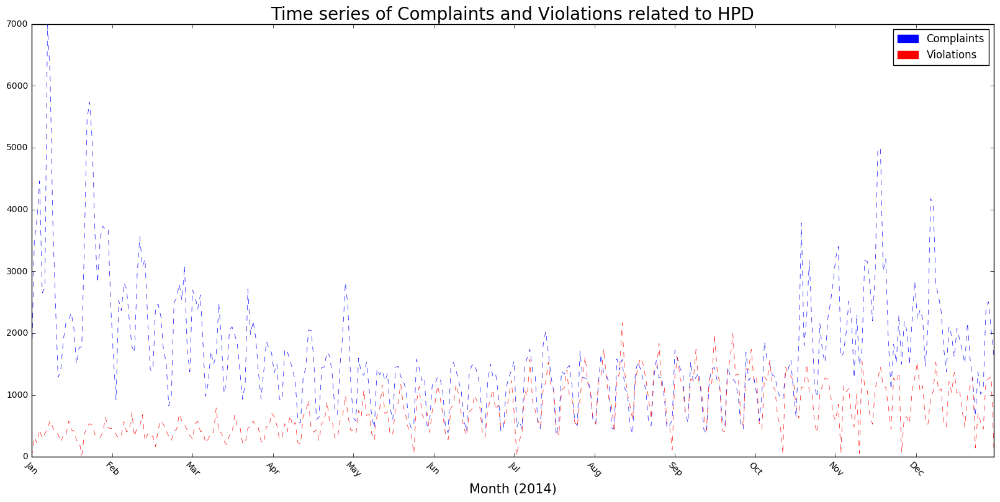

In [13]:
fig = plt.figure(figsize=(20, 9))
plt.title('Time series of Complaints and Violations related to HPD', fontsize=20)
#plt.ylabel('Time series of Complaints and Violations related to HPD', fontsize=15)
plt.xlabel('Month (2014)', fontsize=15)
locs = np.arange(365, step=30.5) # locations
plt.xticks(locs, month_list, rotation=-45)
#plt.plot(mylist_c,C_array, alpha=1, linewidth=0.5, c='Blue')
#plt.plot(mylist_v,V_array, alpha=1, linewidth=0.5, c='Red')

plt.plot(mylist_c_2014,C_array_2014, alpha=1, linewidth=0.5, color='Blue', linestyle='--')
plt.plot(mylist_v_2014,V_array_2014, alpha=1, linewidth=0.5, color='Red', linestyle='--')

blue_patch = mpatches.Patch(color='blue', label='Complaints')
red_patch = mpatches.Patch(color='red', label='Violations')
plt.legend(handles=[blue_patch, red_patch])

plt.legend()
plt.show()

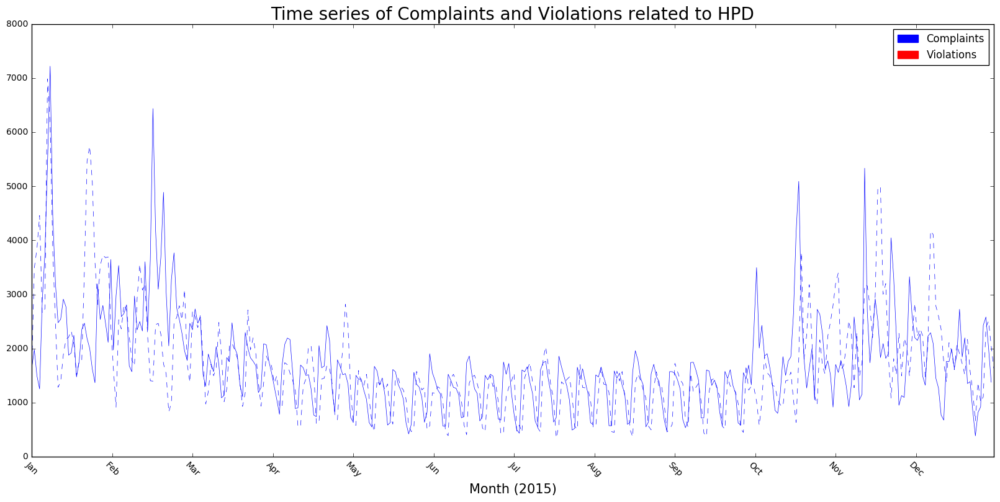

In [14]:
fig = plt.figure(figsize=(20, 9))
plt.title('Time series of Complaints and Violations related to HPD', fontsize=20)
#plt.ylabel('Time series of Complaints and Violations related to HPD', fontsize=15)
plt.xlabel('Month (2015)', fontsize=15)
locs = np.arange(365, step=30.5) # locations
plt.xticks(locs, month_list, rotation=-45)
plt.plot(mylist_c,C_array, alpha=1, linewidth=0.5, c='Blue')
#plt.plot(mylist_v,V_array, alpha=1, linewidth=0.5, c='Red')

plt.plot(mylist_c_2014,C_array_2014, alpha=1, linewidth=0.5, color='Blue', linestyle='--')
#plt.plot(mylist_v_2014,V_array_2014, alpha=1, linewidth=0.5, color='Red', linestyle='--')

blue_patch = mpatches.Patch(color='blue', label='Complaints')
red_patch = mpatches.Patch(color='red', label='Violations')
plt.legend(handles=[blue_patch, red_patch])

plt.legend()
plt.show()

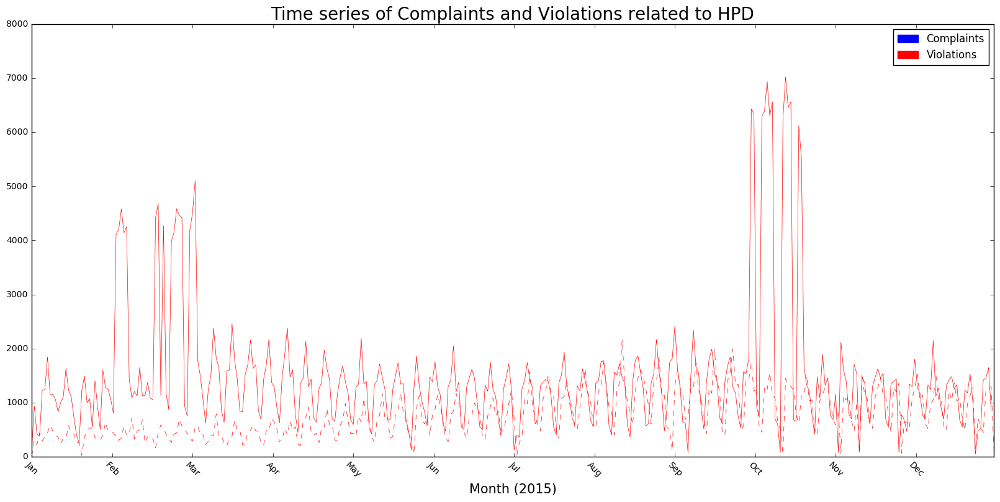

In [15]:
fig = plt.figure(figsize=(20, 9))
plt.title('Time series of Complaints and Violations related to HPD', fontsize=20)
#plt.ylabel('Time series of Complaints and Violations related to HPD', fontsize=15)
plt.xlabel('Month (2015)', fontsize=15)
locs = np.arange(365, step=30.5) # locations
plt.xticks(locs, month_list, rotation=-45)
#plt.plot(mylist_c,C_array, alpha=1, linewidth=0.5, c='Blue')
plt.plot(mylist_v,V_array, alpha=1, linewidth=0.5, c='Red')

#plt.plot(mylist_c_2014,C_array_2014, alpha=1, linewidth=0.5, color='Blue', linestyle='--')
plt.plot(mylist_v_2014,V_array_2014, alpha=1, linewidth=0.5, color='Red', linestyle='--')

blue_patch = mpatches.Patch(color='blue', label='Complaints')
red_patch = mpatches.Patch(color='red', label='Violations')
plt.legend(handles=[blue_patch, red_patch])

plt.legend()
plt.show()

## Aggreated in ZIPCODE level
* correlation between complaints and violations (scatter plot and correlation test)
* correlation between complaints/person and violations/person (scatter ploat and correlation test)
* Ratio of complaints/violations or violations/complaints
* Histogram (distribution) of complaints and violations
* or applying for not total population but # of residential units or # of household

In [16]:
# Load zipcode shapefile
zipcode = gpd.read_file('data/ZIP_CODE_040114/ZIP_CODE_040114.shp')
zipcode['AREA'] = zipcode['AREA'].astype(float)
print len(zipcode)

# Load population in zipcode level data
df_pop = pd.read_csv('data/ZIP_POP.csv', dtype={'ZIPCODE': str})
df_pop['POP'] = df_pop['POP'] + 1.0 # replace population 0 to 1

# Load the number of household in zipcode level data
df_household = pd.read_csv('data/ZIP_HOUSEHOLD.csv', dtype={'ZIPCODE': str})
df_household['HOUSEHOLD'] = df_household['HOUSEHOLD'] + 1.0 # replace the number of household 0 to 1

# Merge data including population and the numebr of household from ACS 2009-2014 5-year estimation
zipcode = pd.merge(zipcode, df_pop, how='left', on=['ZIPCODE'])
zipcode = pd.merge(zipcode, df_household, how='left', on=['ZIPCODE'])

print len(zipcode)

263
263


In [17]:
# Aggregating 2015 complaints in ZIPCODE level 
df_com_zip = df_com.groupby('ZIPCODE').count()
df_com_zip['ZIPCODE'] = df_com_zip.index
df_com_zip = df_com_zip.rename(columns = {'Unique Key': 'Com_Counts'})
df_com_zip = df_com_zip[['ZIPCODE', 'Com_Counts']]

print df_com_zip.head()
print len(df_com_zip)

        ZIPCODE  Com_Counts
ZIPCODE                    
10001     10001        1130
10002     10002        4746
10003     10003        3196
10004     10004          22
10005     10005          29
183


In [18]:
df_com_zip_2014 = df_com_2014.groupby('ZIPCODE').count()
df_com_zip_2014['ZIPCODE'] = df_com_zip_2014.index
df_com_zip_2014 = df_com_zip_2014.rename(columns = {'Unique Key': 'Com_Counts_2014'})
df_com_zip_2014 = df_com_zip_2014[['ZIPCODE', 'Com_Counts_2014']]

print df_com_zip_2014.head()
print len(df_com_zip_2014)

        ZIPCODE  Com_Counts_2014
ZIPCODE                         
10001     10001              982
10002     10002             2717
10003     10003             2801
10004     10004               37
10005     10005               49
183


In [19]:
# Aggregating 2015 complaints in ZIPCODE level by complaint types

Com_type = df_com['Complaint Type'].unique()

for i in Com_type:
    df_tem = df_com.loc[df_com['Complaint Type'].isin([i])]
    df_com_zip_tem = df_tem.groupby('ZIPCODE').count()
    df_com_zip_tem['ZIPCODE'] = df_com_zip_tem.index
    df_com_zip_tem = df_com_zip_tem.rename(columns= {'Unique Key': i})
    df_com_zip_tem = df_com_zip_tem[['ZIPCODE', i]]
    df_com_zip = pd.merge(df_com_zip, df_com_zip_tem, how='left', on=['ZIPCODE'])

df_zip = pd.merge(zipcode, df_com_zip, how='left', on=['ZIPCODE'])    
df_zip = pd.merge(df_zip, df_com_zip_2014, how='left', on=['ZIPCODE'])

print len(df_zip)

263


In [20]:
# Aggregating 2015 violations in ZIPCODE level 
df_vio_zip = df_vio.groupby('ZIPCODE').count()
df_vio_zip['ZIPCODE'] = df_vio_zip.index
df_vio_zip = df_vio_zip.rename(columns = {'ViolationID': 'Vio_Counts'})
df_vio_zip = df_vio_zip[['ZIPCODE', 'Vio_Counts']]

print df_vio_zip.head()
print len(df_vio_zip)

        ZIPCODE  Vio_Counts
ZIPCODE                    
10001     10001         652
10002     10002        3681
10003     10003        2665
10004     10004          14
10005     10005          21
183


In [21]:
# Aggregating 2015 violations in ZIPCODE level 
df_vio_zip_2014 = df_vio_2014.groupby('ZIPCODE').count()
df_vio_zip_2014['ZIPCODE'] = df_vio_zip_2014.index
df_vio_zip_2014 = df_vio_zip_2014.rename(columns = {'ViolationID': 'Vio_Counts_2014'})
df_vio_zip_2014 = df_vio_zip_2014[['ZIPCODE', 'Vio_Counts_2014']]

print df_vio_zip_2014.head()
print len(df_vio_zip_2014)

        ZIPCODE  Vio_Counts_2014
ZIPCODE                         
10001     10001              245
10002     10002              968
10003     10003              745
10004     10004                1
10006     10006                2
177


In [22]:
# Aggregation 2015 violations in ZIPCODE level by violation class

Vio_class = df_vio['Class'].unique()

for i in Vio_class:
    df_tem = df_vio.loc[df_vio['Class'].isin([i])]
    df_vio_zip_tem = df_tem.groupby('ZIPCODE').count()
    df_vio_zip_tem['ZIPCODE'] = df_vio_zip_tem.index
    df_vio_zip_tem = df_vio_zip_tem.rename(columns= {'ViolationID': i})
    df_vio_zip_tem = df_vio_zip_tem[['ZIPCODE', i]]
    df_vio_zip = pd.merge(df_vio_zip, df_vio_zip_tem, how='left', on=['ZIPCODE'])

    
df_zip = pd.merge(df_zip, df_vio_zip, how='left', on=['ZIPCODE'])
df_zip = pd.merge(df_zip, df_vio_zip_2014, how='left', on=['ZIPCODE'])
df_zip = df_zip.fillna(0)    


df_zip['POPULATION'] =  df_zip['POPULATION'] +  1.0
df_zip['HOUSEHOLD'] = df_zip['HOUSEHOLD'] + 1.0
df_zip['HOUSEHOLD'].loc[df_zip['ZIPCODE'] == '11249'] = df_zip['POPULATION'] / 2.69964021832

print len(df_zip)

263


/Users/bh1555/anaconda/lib/python2.7/site-packages/pandas/core/indexing.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [23]:
# Dataframe including com_coutns and vio_counts (also all types and classes)
df_zip.head(2)

,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,...,VACANT APARTMENT,AGENCY,Agency Issues,Com_Counts_2014,Vio_Counts,B,C,A,I,Vio_Counts_2014
0,2.269930e+07,0,Queens,081,18682.0,Jamaica,0.0,0.0,NY,36,...,0.0,0.0,0.0,770.0,296.0,164.0,62.0,36.0,34.0,155.0
1,2.963100e+07,0,Kings,047,62427.0,Brooklyn,0.0,0.0,NY,36,...,0.0,0.0,0.0,12601.0,9813.0,5245.0,1729.0,1683.0,1156.0,5377.0


In [24]:
# Normalized by population and the number of households
df_zip['com_percapita'] = df_zip['Com_Counts'] / df_zip['POPULATION']
df_zip['com_perhousehold'] = df_zip['Com_Counts'] / df_zip['HOUSEHOLD']
df_zip['vio_percapita'] = df_zip['Vio_Counts'] / df_zip['POPULATION']
df_zip['vio_perhousehold'] = df_zip['Vio_Counts'] / df_zip['HOUSEHOLD']

df_zip['com_percapita_2014'] = df_zip['Com_Counts_2014'] / df_zip['POPULATION']
df_zip['com_perhousehold_2014'] = df_zip['Com_Counts_2014'] / df_zip['HOUSEHOLD']
df_zip['vio_percapita_2014'] = df_zip['Vio_Counts_2014'] / df_zip['POPULATION']
df_zip['vio_perhousehold_2014'] = df_zip['Vio_Counts_2014'] / df_zip['HOUSEHOLD']


In [25]:
df_zip[['ZIPCODE', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold']].head()

,ZIPCODE,Com_Counts,Vio_Counts,com_percapita,vio_percapita,com_perhousehold,vio_perhousehold
0,11436,485.0,296.0,0.025961,0.015844,0.089848,0.054835
1,11213,11925.0,9813.0,0.191023,0.157192,0.503738,0.414523
2,11212,11018.0,10005.0,0.131375,0.119296,0.359045,0.326034
3,11225,11603.0,8541.0,0.205261,0.151093,0.509082,0.374737
4,11218,4815.0,5280.0,0.066615,0.073048,0.193911,0.212637


In [26]:
df_zip[['ZIPCODE', 'Com_Counts_2014', 'Vio_Counts_2014', 'com_percapita_2014', 'vio_percapita_2014', 
        'com_perhousehold_2014', 'vio_perhousehold_2014']].head()

,ZIPCODE,Com_Counts_2014,Vio_Counts_2014,com_percapita_2014,vio_percapita_2014,com_perhousehold_2014,vio_perhousehold_2014
0,11436,770.0,155.0,0.041216,0.008297,0.142645,0.028714
1,11213,12601.0,5377.0,0.201852,0.086133,0.532294,0.227136
2,11212,11993.0,6672.0,0.143000,0.079555,0.390817,0.217421
3,11225,12437.0,5231.0,0.220015,0.092538,0.545674,0.229510
4,11218,4668.0,2213.0,0.064581,0.030617,0.187991,0.089122


### Cholopleth maps 

/Users/bh1555/anaconda/lib/python2.7/site-packages/geopandas/plotting.py:225: FutureWarning: 'colormap' is deprecated, please use 'cmap' instead (for consistency with matplotlib)
  "(for consistency with matplotlib)", FutureWarning)


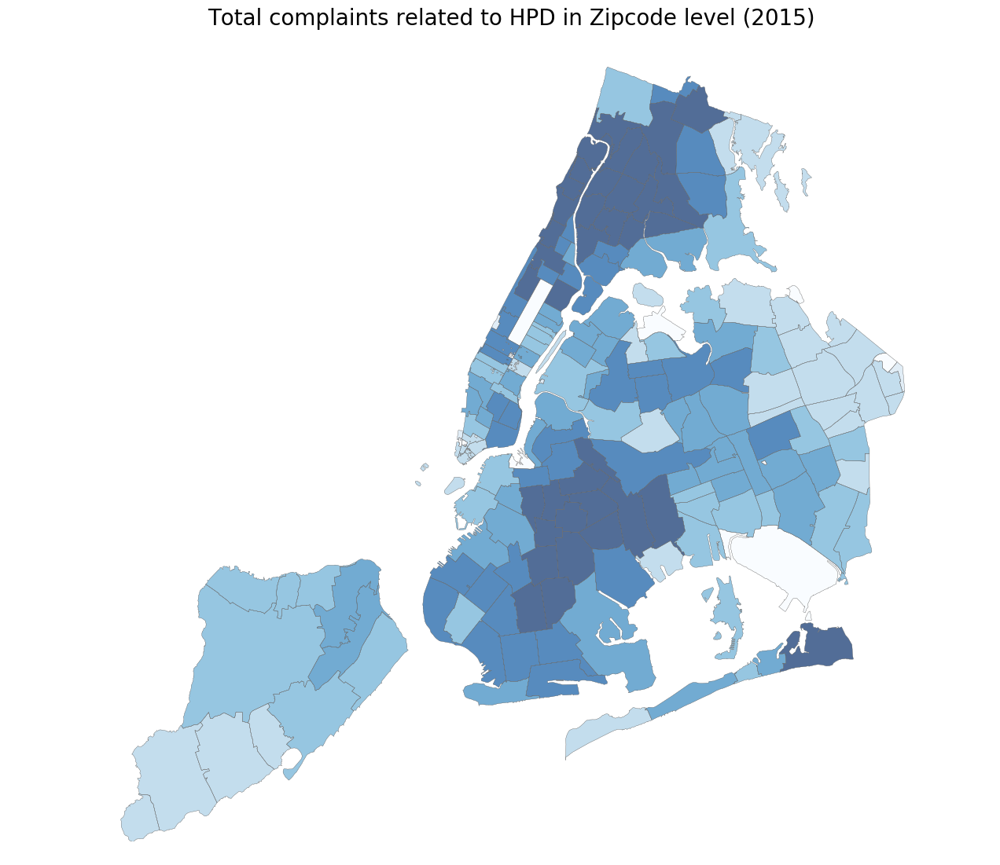

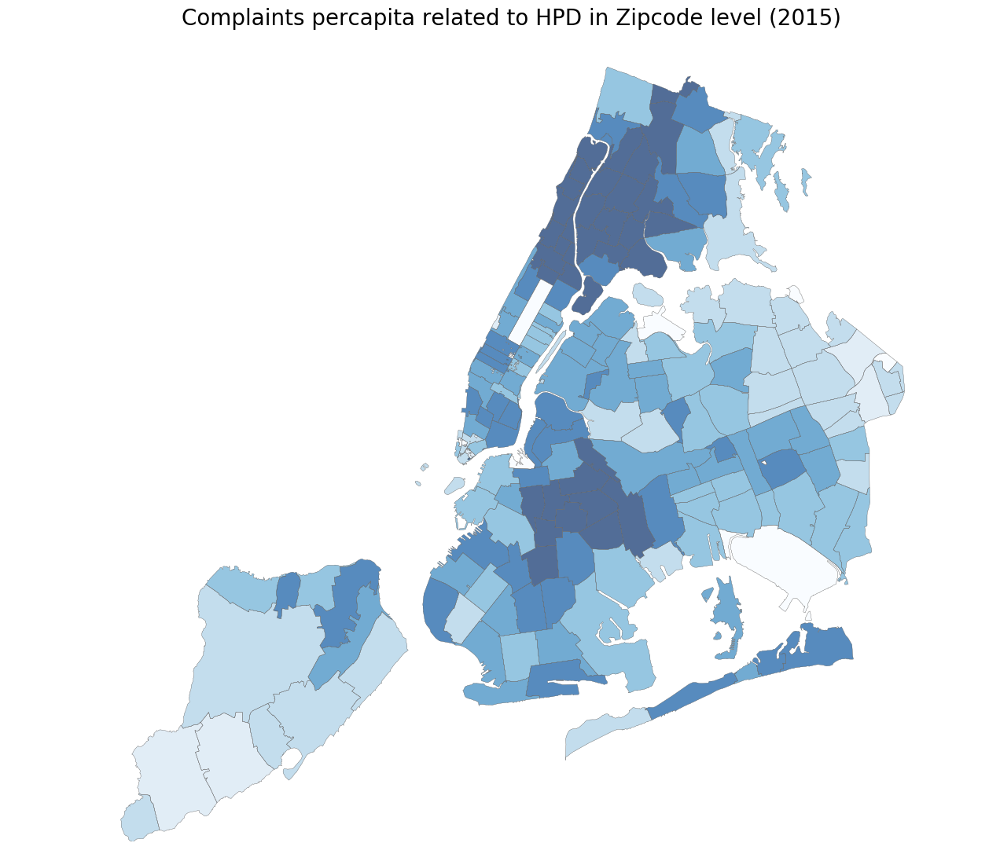

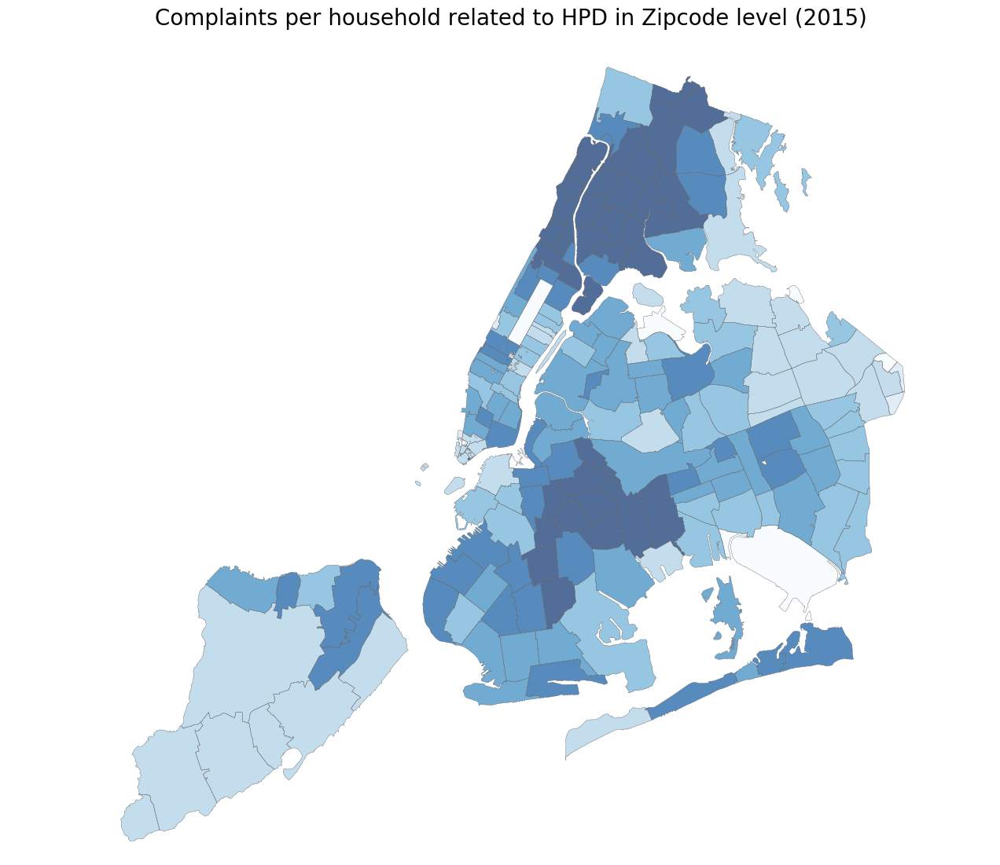

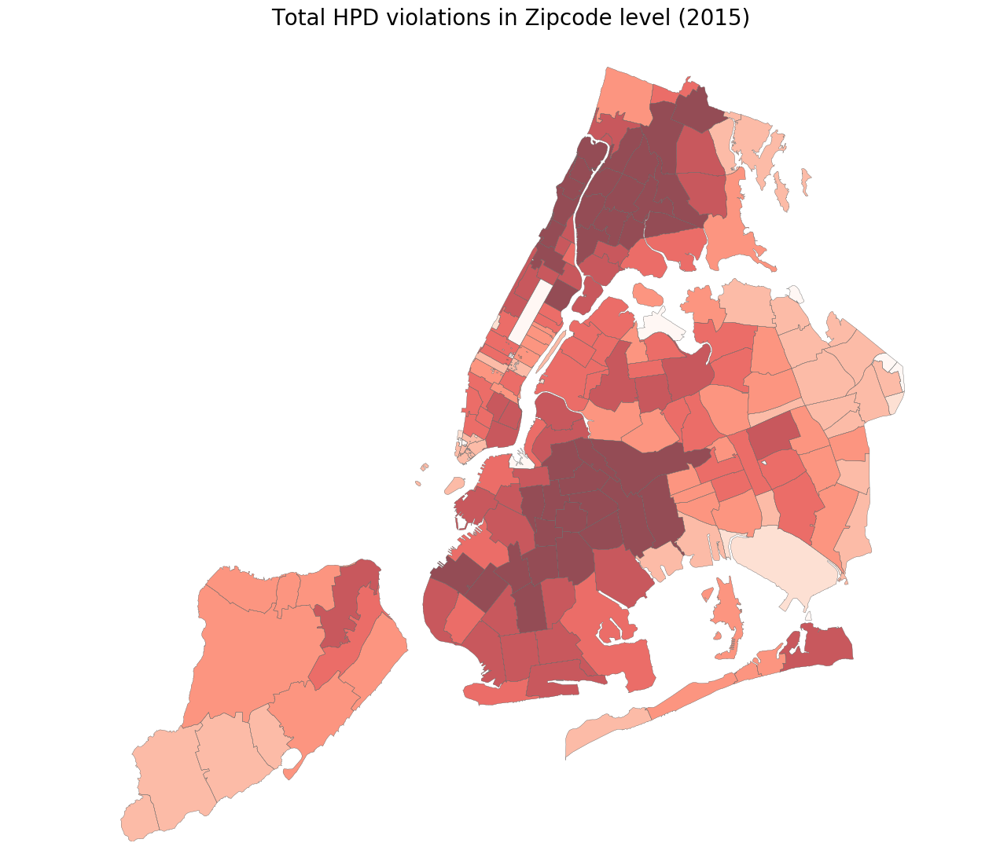

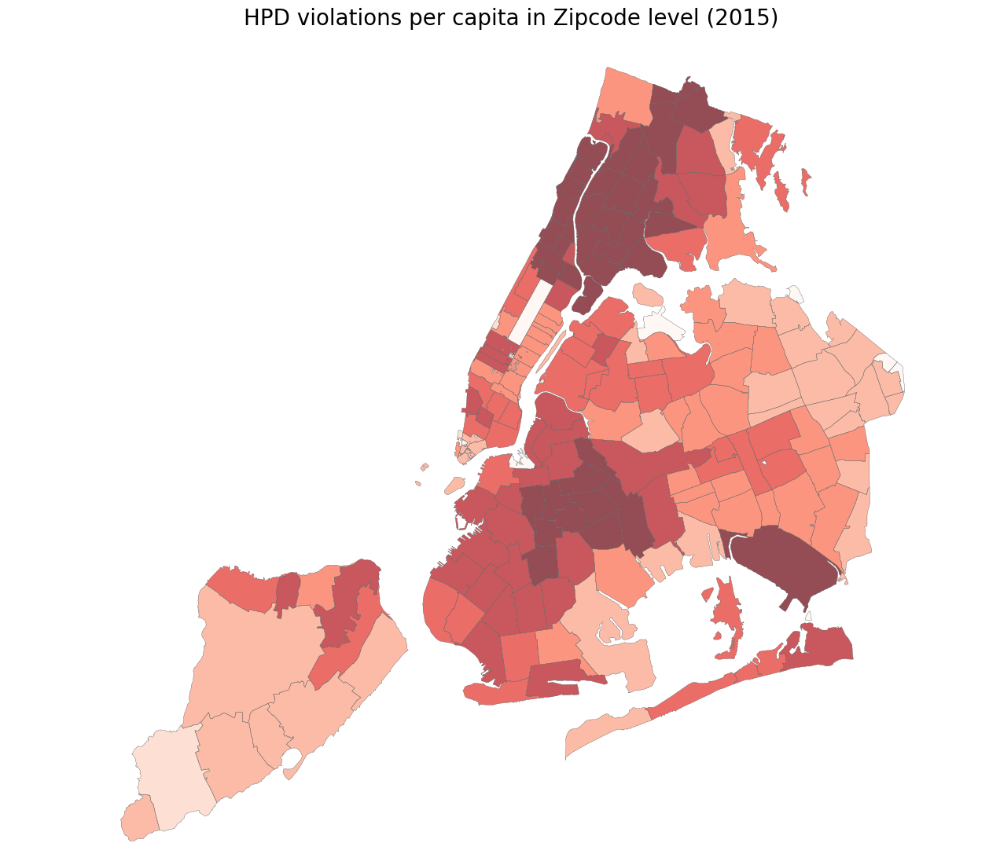

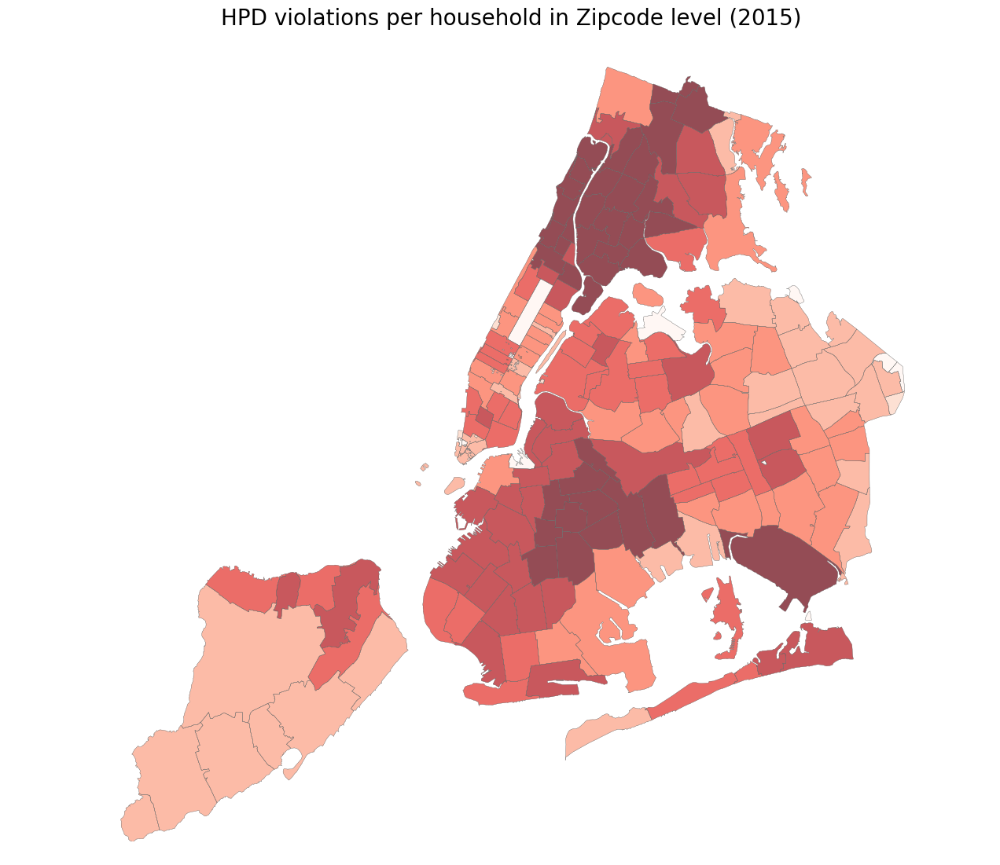

In [27]:
# Cholopleth maps 2015


# Total Complaints
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'Com_Counts', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Total complaints related to HPD in Zipcode level (2015)', size=20)

# Complaints per capita
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'com_percapita', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Complaints percapita related to HPD in Zipcode level (2015)', size=20)

# Complaints per household
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'com_perhousehold', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Complaints per household related to HPD in Zipcode level (2015)', size=20)



# Total Violations
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'Vio_Counts', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Total HPD violations in Zipcode level (2015)', size=20)

# Violations per capita
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'vio_percapita', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('HPD violations per capita in Zipcode level (2015)', size=20)

# Violations per household
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'vio_perhousehold', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('HPD violations per household in Zipcode level (2015)', size=20)

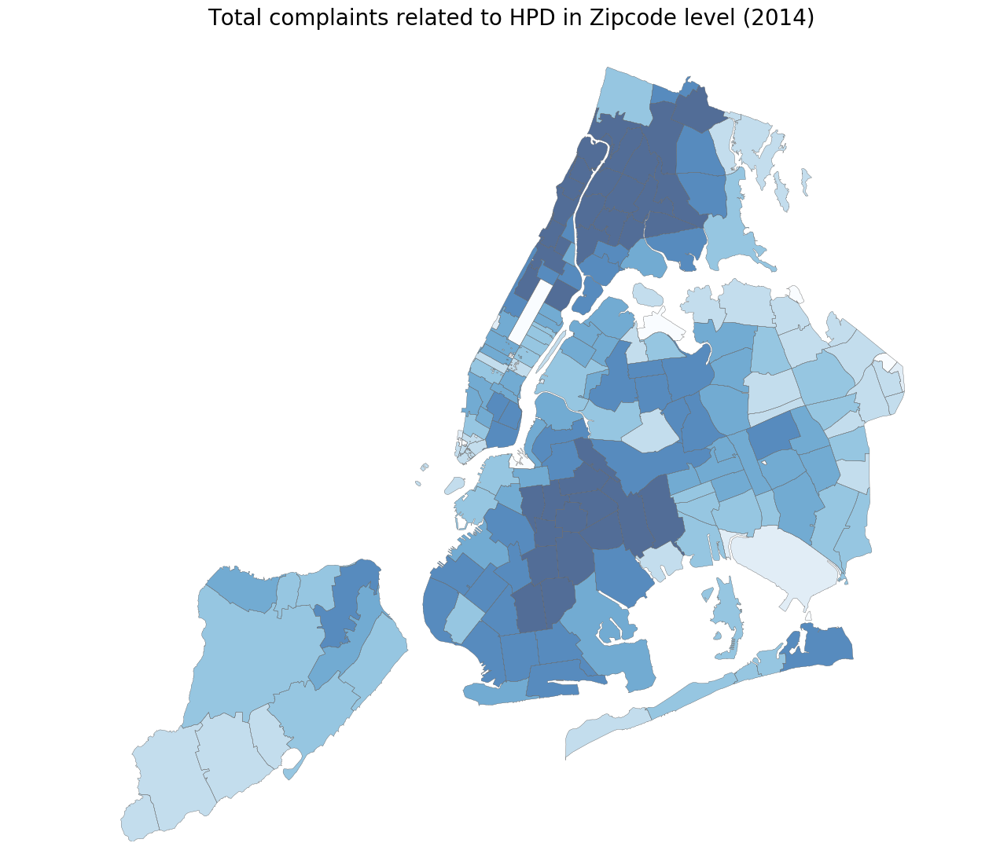

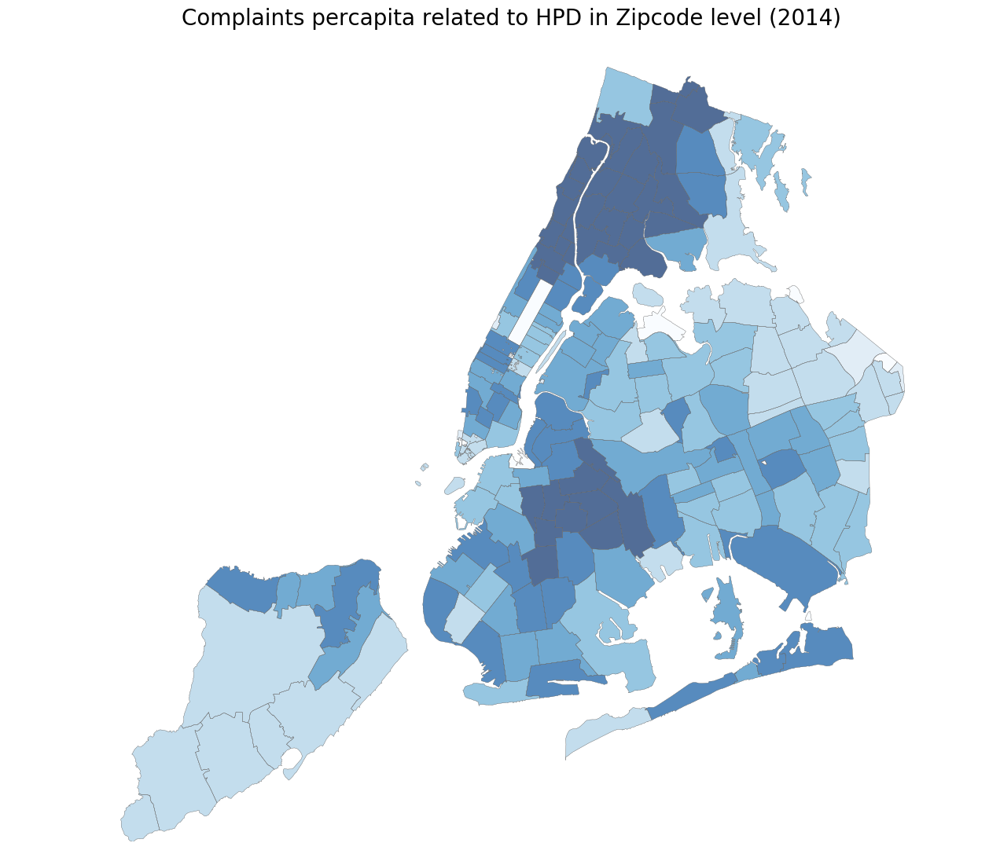

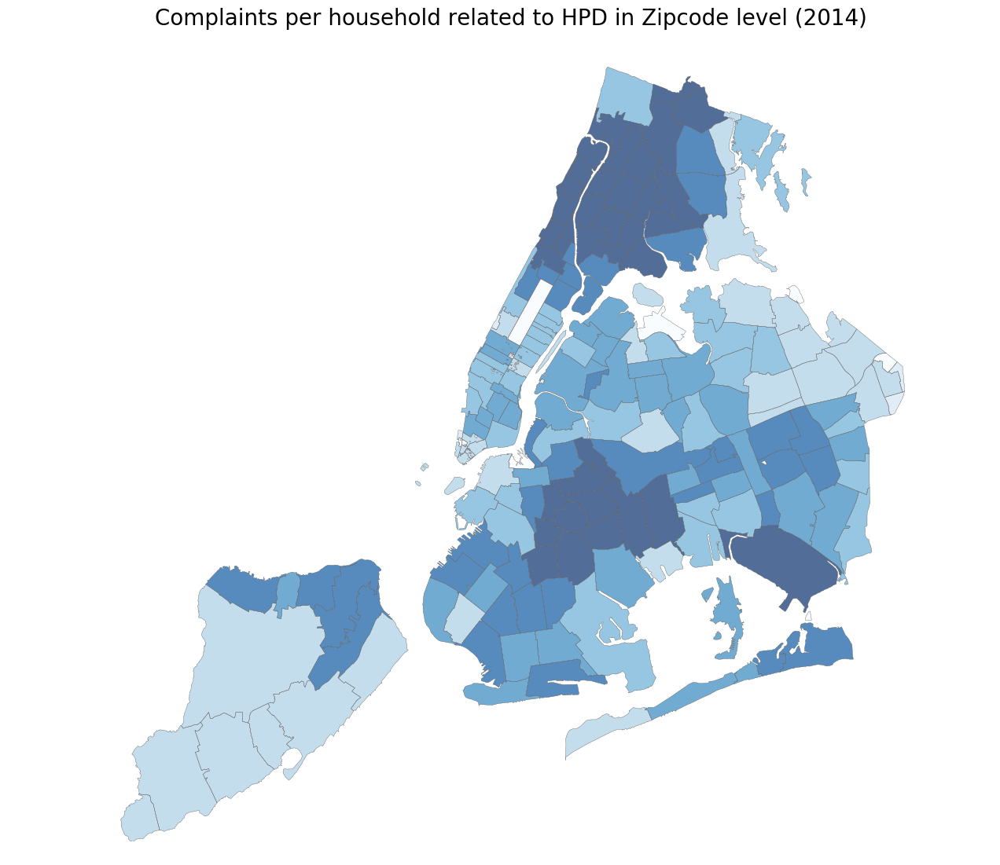

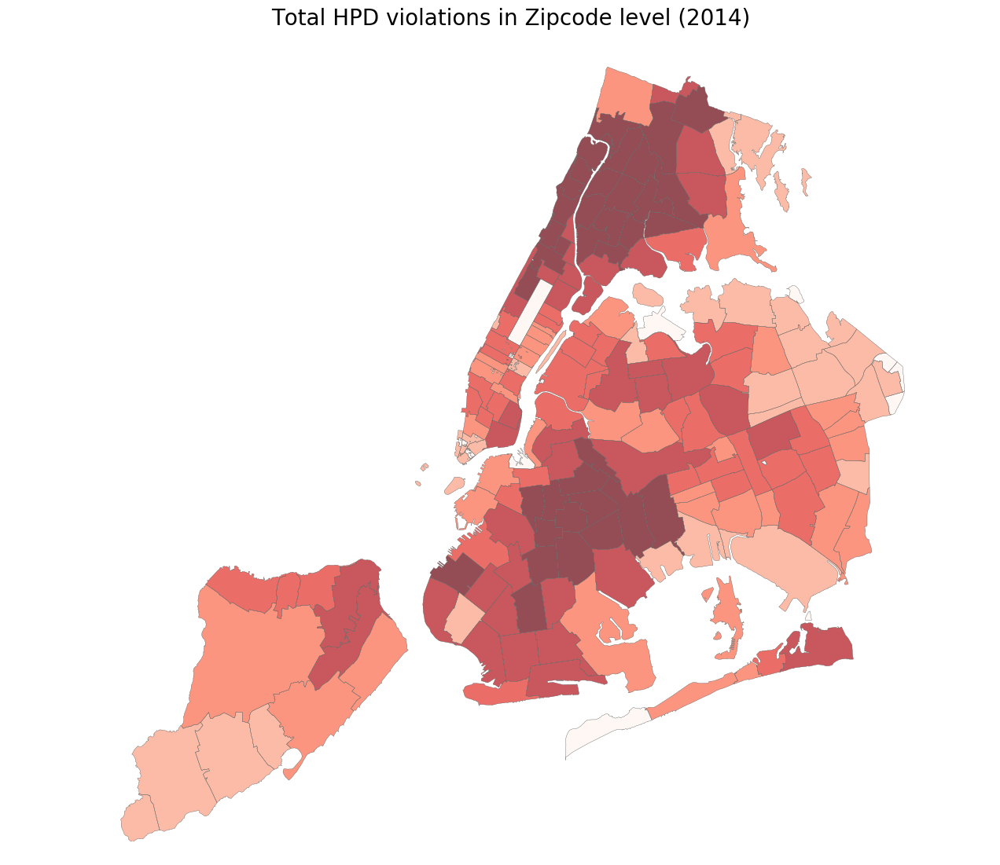

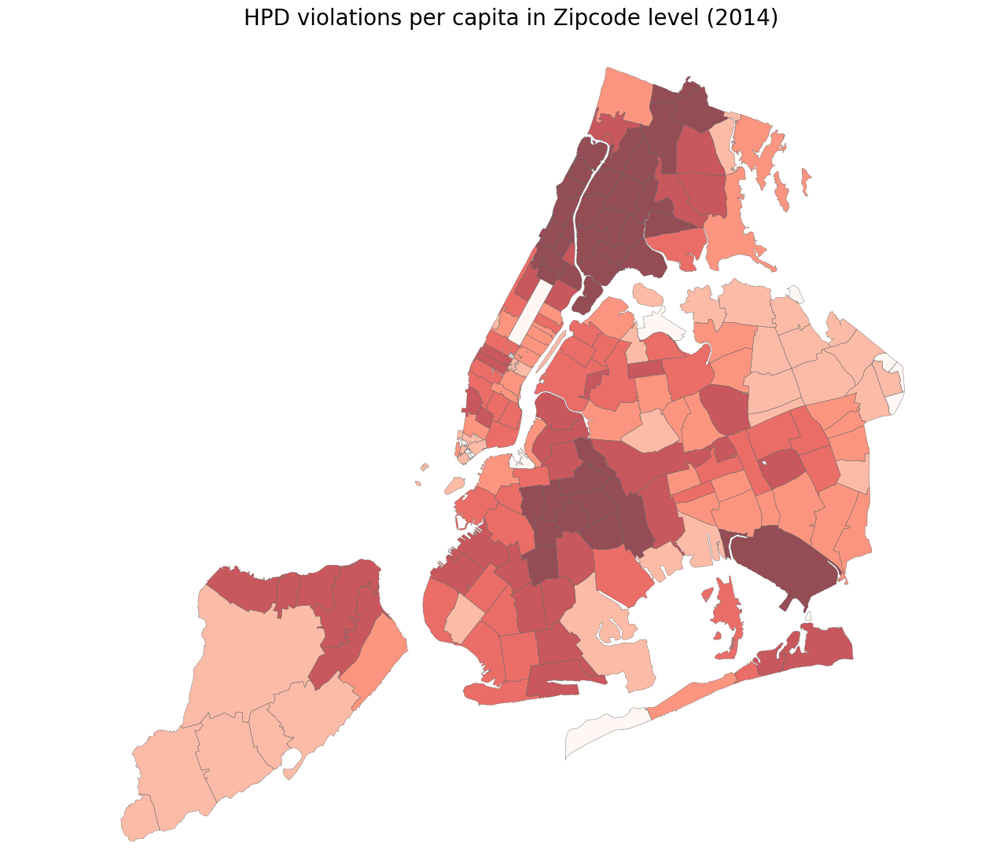

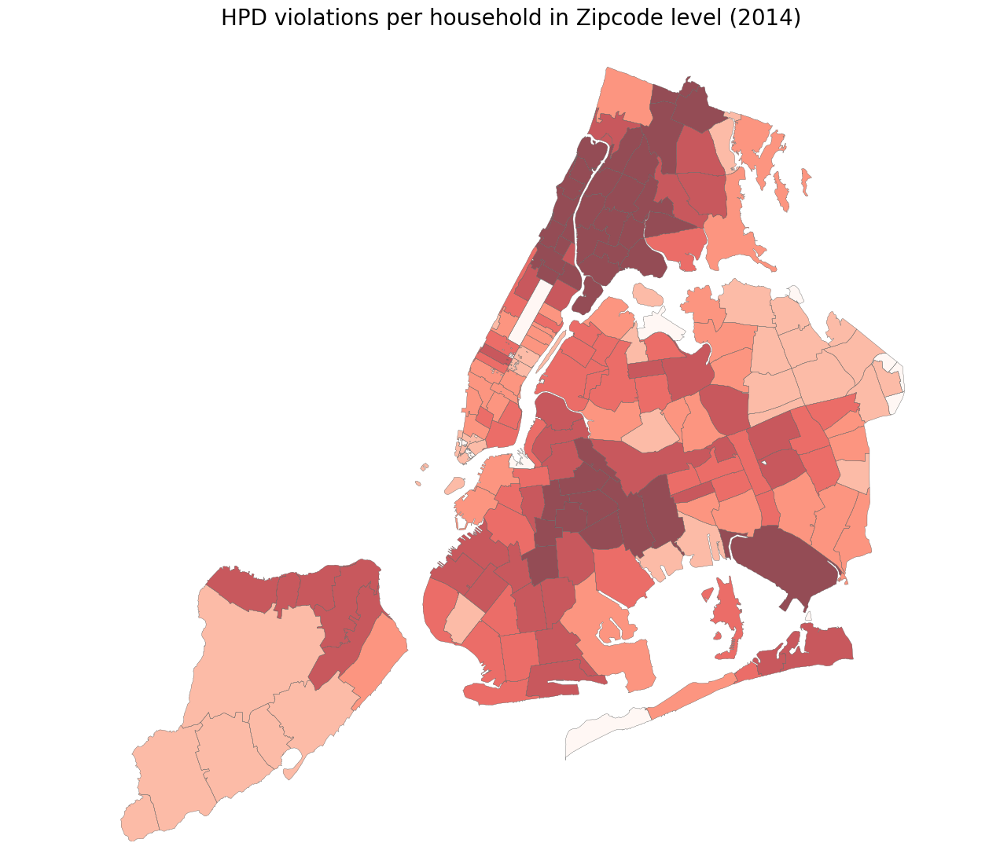

In [28]:
# Cholopleth maps 2014


# Total Complaints
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'Com_Counts_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Total complaints related to HPD in Zipcode level (2014)', size=20)

# Complaints per capita
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'com_percapita_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Complaints percapita related to HPD in Zipcode level (2014)', size=20)

# Complaints per household
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'com_perhousehold_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Complaints per household related to HPD in Zipcode level (2014)', size=20)



# Total Violations
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'Vio_Counts_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Total HPD violations in Zipcode level (2014)', size=20)

# Violations per capita
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'vio_percapita_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('HPD violations per capita in Zipcode level (2014)', size=20)

# Violations per household
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(column = 'vio_perhousehold_2014', ax = ax, scheme='QUANTILES', k=7, colormap = 'Reds', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('HPD violations per household in Zipcode level (2014)', size=20)

* correlation between complaints and violations (scatter plot and correlation test)
* correlation between complaints/person and violations/person (scatter ploat and correlation test)
* Ratio of complaints/violations or violations/complaints
* Histogram (distribution) of complaints and violations
* or applying for not total population but # of residential units or # of household

### Correlation betwwne complaints vs. violations 
* Histograms (distribution)
* Scatter plot and correlaton test

Min value of total complaints:  0.0
Mean value of total complaints:  2406.68821293
Std value of total complaints:  3742.65708591
Max value of total complaints:  20900.0


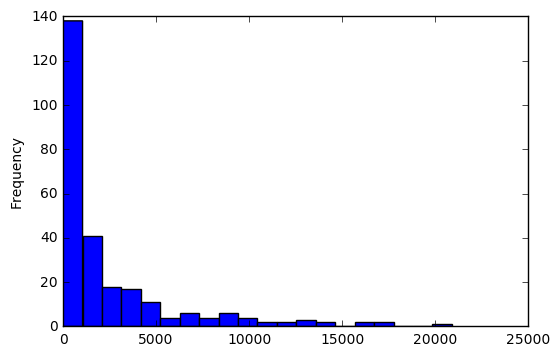

In [29]:
df_zip['Com_Counts'].plot.hist(bins=20)
print 'Min value of total complaints: ', min(df_zip['Com_Counts'])
print 'Mean value of total complaints: ', df_zip['Com_Counts'].mean()
print 'Std value of total complaints: ', df_zip['Com_Counts'].std()
print 'Max value of total complaints: ', max(df_zip['Com_Counts'])

Min value of complaints per capita:  0.0
Mean value of complaints per capita:  0.0607775788368
Std value of complaints per capita:  0.179199085592
Max value of complaints per capita:  2.0


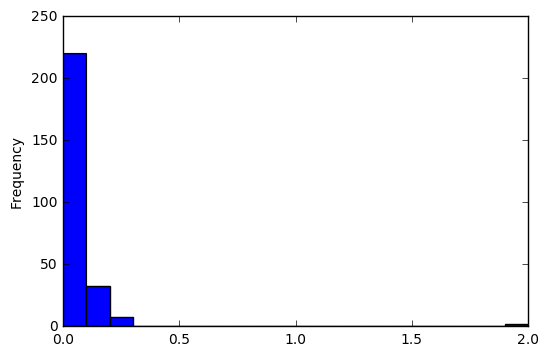

In [30]:
df_zip['com_percapita'].plot.hist(bins=20)
print 'Min value of complaints per capita: ', min(df_zip['com_percapita'])
print 'Mean value of complaints per capita: ', df_zip['com_percapita'].mean()
print 'Std value of complaints per capita: ', df_zip['com_percapita'].std()
print 'Max value of complaints per capita: ', max(df_zip['com_percapita'])

Min value of complaints per household:  0.0
Mean value of complaints per household:  0.128667884977
Std value of complaints per household:  0.195453010084
Max value of complaints per household:  2.0


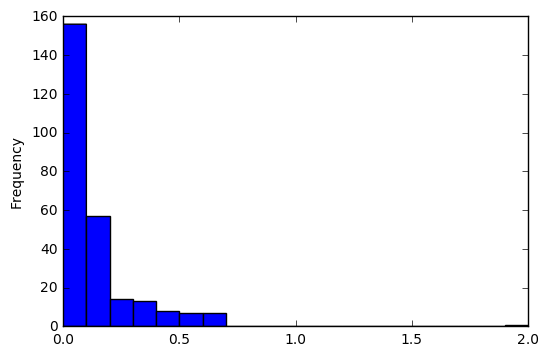

In [31]:
df_zip['com_perhousehold'].plot.hist(bins=20)
print 'Min value of complaints per household: ', min(df_zip['com_perhousehold'])
print 'Mean value of complaints per household: ', df_zip['com_perhousehold'].mean()
print 'Std value of complaints per household: ', df_zip['com_perhousehold'].std()
print 'Max value of complaints per household: ', max(df_zip['com_perhousehold'])

Min value of total violations:  0.0
Mean value of total violations:  2142.90114068
Std value of total violations:  3358.96026229
Max value of total violations:  17522.0


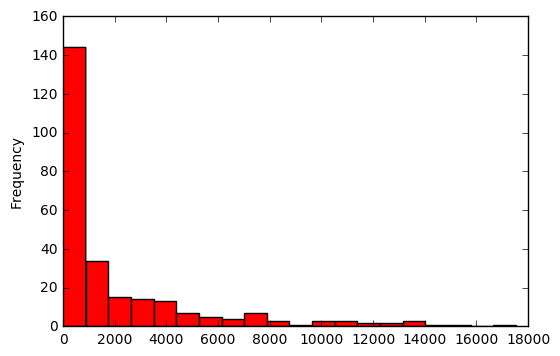

In [32]:
df_zip['Vio_Counts'].plot.hist(bins=20, color='Red')
print 'Min value of total violations: ', min(df_zip['Vio_Counts'])
print 'Mean value of total violations: ', df_zip['Vio_Counts'].mean()
print 'Std value of total violations: ', df_zip['Vio_Counts'].std()
print 'Max value of total violations: ', max(df_zip['Vio_Counts'])

Min value of violations per capita:  0.0
Mean value of violations per capita:  0.0406124586189
Std value of violations per capita:  0.0514407062222
Max value of violations per capita:  0.232393748575


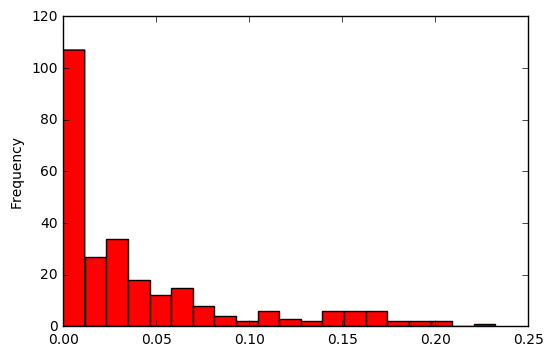

In [33]:
df_zip['vio_percapita'].plot.hist(bins=20, color='Red')
print 'Min value of violations per capita: ', min(df_zip['vio_percapita'])
print 'Mean value of violations per capita: ', df_zip['vio_percapita'].mean()
print 'Std value of violations per capita: ', df_zip['vio_percapita'].std()
print 'Max value of violations per capita: ', max(df_zip['vio_percapita'])

Min value of violations per household:  0.0
Mean value of violations per household:  0.112579595305
Std value of violations per household:  0.166524387126
Max value of violations per household:  1.5


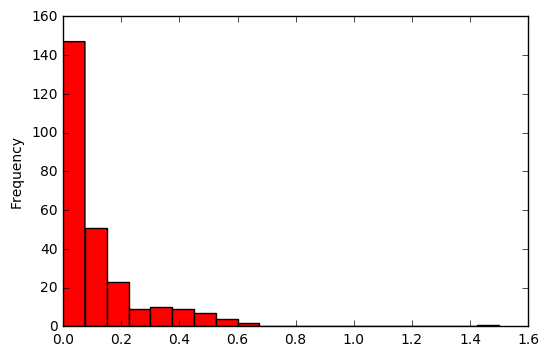

In [34]:
df_zip['vio_perhousehold'].plot.hist(bins=20, color='Red')
print 'Min value of violations per household: ', min(df_zip['vio_perhousehold'])
print 'Mean value of violations per household: ', df_zip['vio_perhousehold'].mean()
print 'Std value of violations per household: ', df_zip['vio_perhousehold'].std()
print 'Max value of violations per household: ', max(df_zip['vio_perhousehold'])

In [35]:
df_zip[['ZIPCODE', 'POP', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold']].describe()

,POP,HOUSEHOLD,Com_Counts,Vio_Counts,com_percapita,vio_percapita,com_perhousehold,vio_perhousehold
count,263.000000,263.000000,263.000000,263.000000,263.000000,263.000000,263.000000,263.000000
mean,32934.733840,12240.157014,2406.688213,2142.901141,0.060778,0.040612,0.128668,0.112580
std,30504.184216,11054.077931,3742.657086,3358.960262,0.179199,0.051441,0.195453,0.166524
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,29531.000000,10798.000000,735.000000,649.000000,0.028910,0.021916,0.071031,0.056210
75%,55846.500000,20500.000000,3127.500000,2716.000000,0.060283,0.057015,0.148072,0.147004
max,110386.000000,43609.000000,20900.000000,17522.000000,2.000000,0.232394,2.000000,1.500000


### Need to remove OUTLIERS!
* out of +3std and -3std

In [36]:
col_list = ['Vio_Counts', 'com_percapita', 'vio_percapita', 'com_perhousehold', 'vio_perhousehold']
df_zip_clean = df_zip[((df_zip['Com_Counts'] - df_zip['Com_Counts'].mean()) / df_zip['Com_Counts'].std()).abs() < 3]
print 'removing outlier regarding Com_Counts', ': ', len(df_zip_clean)


for i in col_list:
    df_zip_clean = df_zip_clean[((df_zip_clean[i] - df_zip_clean[i].mean()) / df_zip_clean[i].std()).abs() < 3]
    
    print 'removing outlier regarding ', i, ': ', len(df_zip_clean)
    # Where outliers 

removing outlier regarding Com_Counts :  256
removing outlier regarding  Vio_Counts :  250
removing outlier regarding  com_percapita :  248
removing outlier regarding  vio_percapita :  243
removing outlier regarding  com_perhousehold :  238
removing outlier regarding  vio_perhousehold :  234


### Most outliers over 3std are located in nothern Manhattan, southern Bronx, and middle of Brooklyn!

(900000.0, 1080000.0, 120000.0, 280000.0)

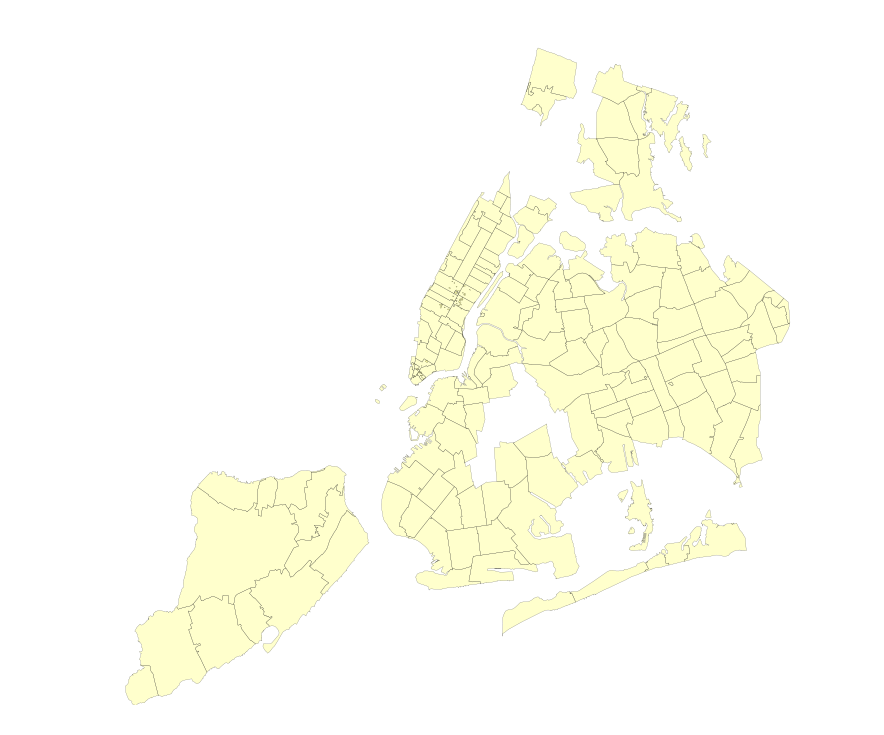

In [37]:
# Where outliers
fig, ax = plt.subplots(figsize = (10,10))
ax.set_aspect('equal')
df_zip_clean.plot(ax = ax, color = 'Yellow', alpha= 0.2, linewidth = 0.1)
plt.axis('off')

### Correlation test

In [38]:
# Including outliers
df_zip[['ZIPCODE', 'POPULATION', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold', 'Com_Counts_2014', 'Vio_Counts_2014', 
              'com_percapita_2014', 'vio_percapita_2014', 'com_perhousehold_2014', 'vio_perhousehold_2014']].corr()

,POPULATION,HOUSEHOLD,Com_Counts,Vio_Counts,com_percapita,vio_percapita,com_perhousehold,vio_perhousehold,Com_Counts_2014,Vio_Counts_2014,com_percapita_2014,vio_percapita_2014,com_perhousehold_2014,vio_perhousehold_2014
POPULATION,1.000000,0.962236,0.705243,0.708980,0.087238,0.551963,0.426896,0.466200,0.694253,0.611840,0.567579,0.435706,0.568402,0.245671
HOUSEHOLD,0.962236,1.000000,0.661634,0.656265,0.081553,0.527936,0.386451,0.417123,0.648676,0.555834,0.546276,0.400047,0.517309,0.209746
Com_Counts,0.705243,0.661634,1.000000,0.976955,0.226993,0.854809,0.710211,0.738937,0.991900,0.973404,0.900628,0.800892,0.903309,0.492877
Vio_Counts,0.708980,0.656265,0.976955,1.000000,0.219213,0.879664,0.694178,0.762924,0.969323,0.973921,0.876214,0.802377,0.884550,0.496263
com_percapita,0.087238,0.081553,0.226993,0.219213,1.000000,0.230667,0.621380,0.190416,0.222537,0.228697,0.243097,0.220358,0.236150,0.126546
vio_percapita,0.551963,0.527936,0.854809,0.879664,0.230667,1.000000,0.726576,0.917601,0.837700,0.858384,0.947028,0.938856,0.953067,0.682251
com_perhousehold,0.426896,0.386451,0.710211,0.694178,0.621380,0.726576,1.000000,0.623853,0.696048,0.704925,0.754320,0.677909,0.752668,0.411276
vio_perhousehold,0.466200,0.417123,0.738937,0.762924,0.190416,0.917601,0.623853,1.000000,0.725147,0.753801,0.815286,0.965208,0.892048,0.906063
Com_Counts_2014,0.694253,0.648676,0.991900,0.969323,0.222537,0.837700,0.696048,0.725147,1.000000,0.970386,0.899775,0.790387,0.902074,0.486970
Vio_Counts_2014,0.611840,0.555834,0.973404,0.973921,0.228697,0.858384,0.704925,0.753801,0.970386,1.000000,0.883773,0.832542,0.898892,0.522422


In [39]:
# Exclueing outliers
df_zip_clean[['ZIPCODE', 'POPULATION', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold', 'Com_Counts_2014', 'Vio_Counts_2014', 
              'com_percapita_2014', 'vio_percapita_2014', 'com_perhousehold_2014', 'vio_perhousehold_2014']].corr()

,POPULATION,HOUSEHOLD,Com_Counts,Vio_Counts,com_percapita,vio_percapita,com_perhousehold,vio_perhousehold,Com_Counts_2014,Vio_Counts_2014,com_percapita_2014,vio_percapita_2014,com_perhousehold_2014,vio_perhousehold_2014
POPULATION,1.000000,0.958279,0.786213,0.783929,0.563018,0.574911,0.614833,0.624451,0.751635,0.677936,0.555974,0.486075,0.602439,0.518616
HOUSEHOLD,0.958279,1.000000,0.769350,0.749571,0.585243,0.584161,0.584159,0.581000,0.730023,0.645823,0.567793,0.481978,0.566798,0.477980
Com_Counts,0.786213,0.769350,1.000000,0.945730,0.834518,0.799511,0.868269,0.827388,0.976963,0.947876,0.834013,0.798660,0.861247,0.813449
Vio_Counts,0.783929,0.749571,0.945730,1.000000,0.773187,0.844681,0.816866,0.881346,0.920210,0.941620,0.772173,0.785162,0.808527,0.809065
com_percapita,0.563018,0.585243,0.834518,0.773187,1.000000,0.933411,0.970338,0.898751,0.804311,0.793623,0.969854,0.929982,0.938424,0.893286
vio_percapita,0.574911,0.584161,0.799511,0.844681,0.933411,1.000000,0.917308,0.971818,0.769542,0.804474,0.910546,0.922681,0.890832,0.896580
com_perhousehold,0.614833,0.584159,0.868269,0.816866,0.970338,0.917308,1.000000,0.937716,0.840959,0.837939,0.950435,0.926027,0.972181,0.932967
vio_perhousehold,0.624451,0.581000,0.827388,0.881346,0.898751,0.971818,0.937716,1.000000,0.799419,0.842698,0.884160,0.911572,0.914765,0.928126
Com_Counts_2014,0.751635,0.730023,0.976963,0.920210,0.804311,0.769542,0.840959,0.799419,1.000000,0.951077,0.850355,0.797391,0.878964,0.813732
Vio_Counts_2014,0.677936,0.645823,0.947876,0.941620,0.793623,0.804474,0.837939,0.842698,0.951077,1.000000,0.821987,0.863119,0.858830,0.887275


In [40]:
a= df_zip[['ZIPCODE', 'POPULATION', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold', 'Com_Counts_2014', 'Vio_Counts_2014', 
              'com_percapita_2014', 'vio_percapita_2014', 'com_perhousehold_2014', 'vio_perhousehold_2014']].corr()
a.to_csv('data/correlation_inoutliers.csv')
b= df_zip_clean[['ZIPCODE', 'POPULATION', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold', 'Com_Counts_2014', 'Vio_Counts_2014', 
              'com_percapita_2014', 'vio_percapita_2014', 'com_perhousehold_2014', 'vio_perhousehold_2014']].corr()
b.to_csv('data/correlation_exoutliers.csv')

### Scatter plots and simple OLS regression

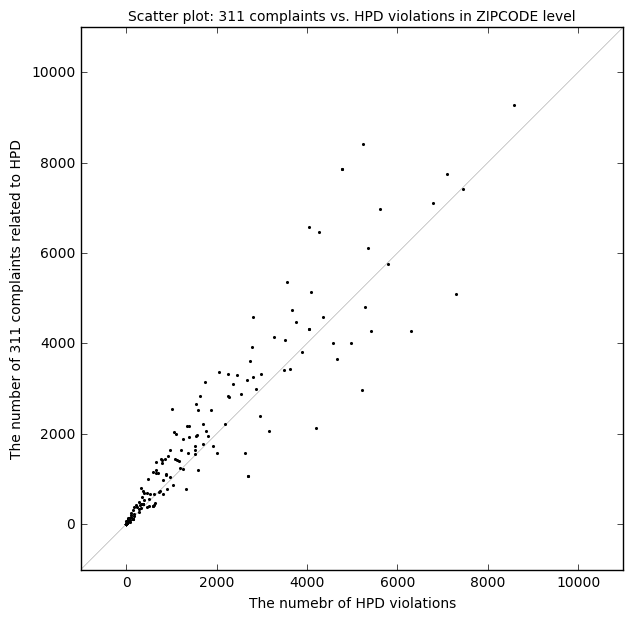

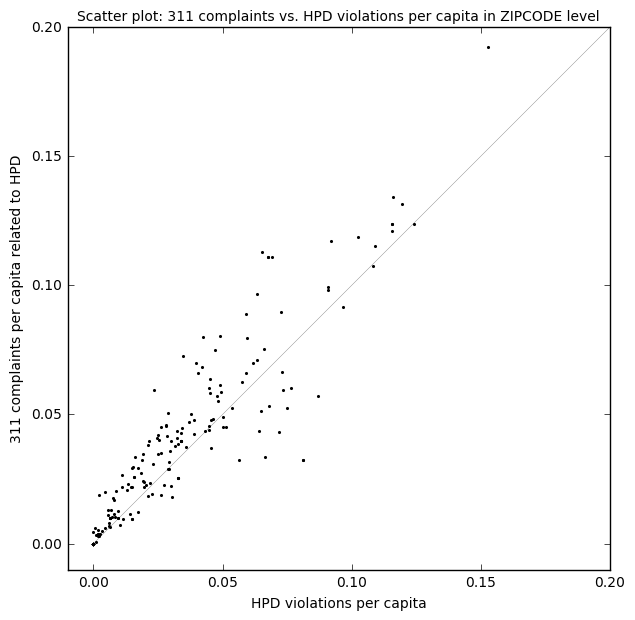

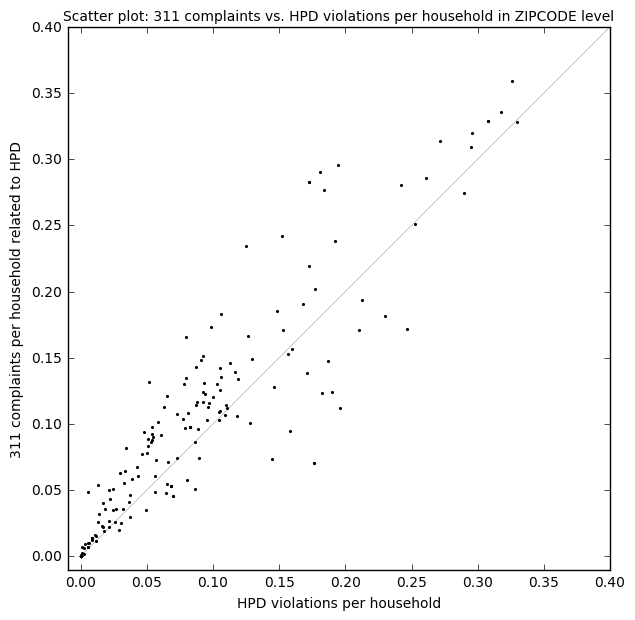

In [41]:
# Scatter plot of total complaints vs. violations

fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(-1000,11000)
plt.ylim(-1000,11000)
plt.scatter(df_zip_clean['Vio_Counts'], df_zip_clean['Com_Counts'], s=5, color='k', linewidth=0)
x = range(-1000,25000)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints vs. HPD violations in ZIPCODE level', size=10)
plt.ylabel('The number of 311 complaints related to HPD')
plt.xlabel('The numebr of HPD violations')


# Scatter plot of complaints vs. violations per capita

fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(-0.01,0.2)
plt.ylim(-0.01,0.2)
plt.scatter( df_zip_clean['vio_percapita'],df_zip_clean['com_percapita'], s=5, color='k', linewidth=0)
x = range(0,2)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints vs. HPD violations per capita in ZIPCODE level', size=10)
plt.ylabel('311 complaints per capita related to HPD')
plt.xlabel('HPD violations per capita')


# Scatter plot of complaints vs. violations per household

fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(-0.01,0.4)
plt.ylim(-0.01,0.4)
plt.scatter(df_zip_clean['vio_perhousehold'], df_zip_clean['com_perhousehold'], s=5, color='k', linewidth=0)
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints vs. HPD violations per household in ZIPCODE level', size=10)
plt.ylabel('311 complaints per household related to HPD')
plt.xlabel('HPD violations per household')

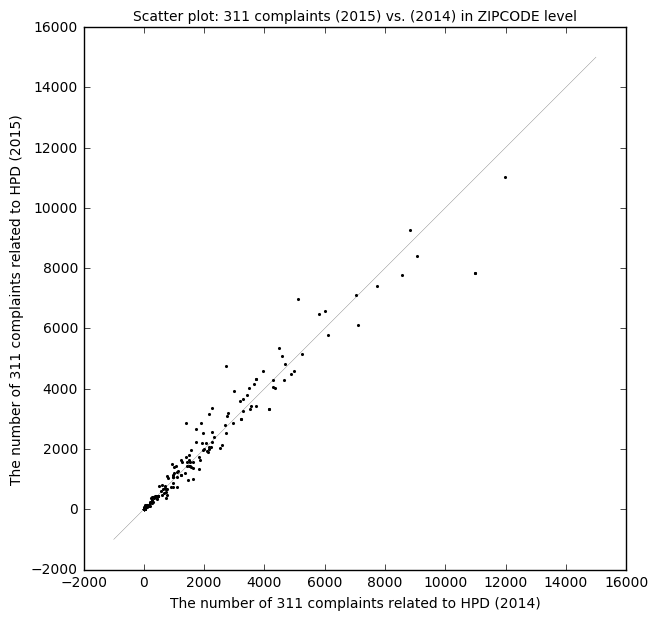

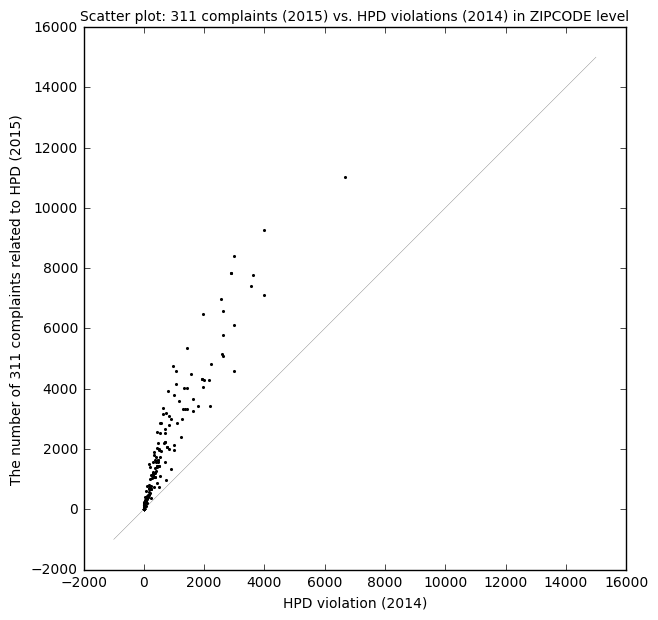

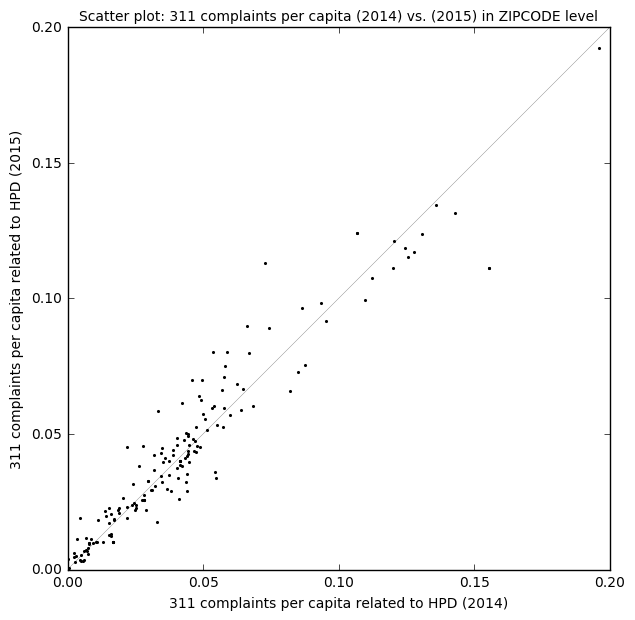

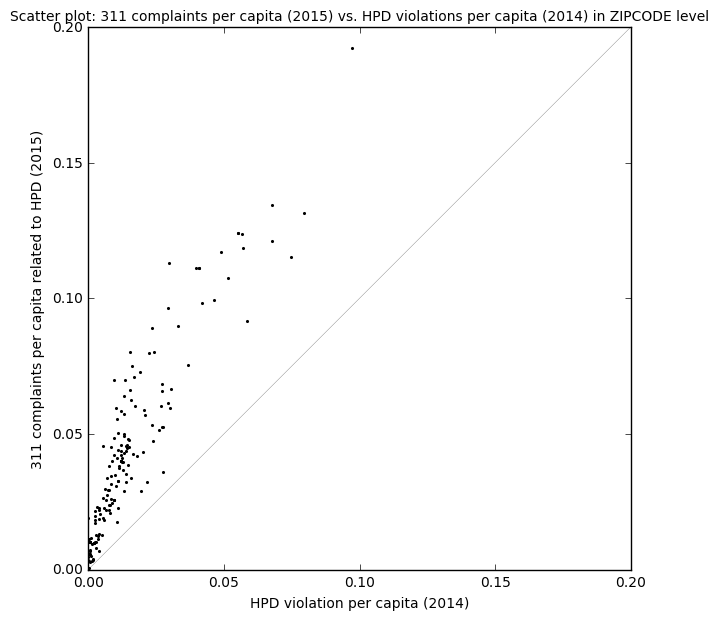

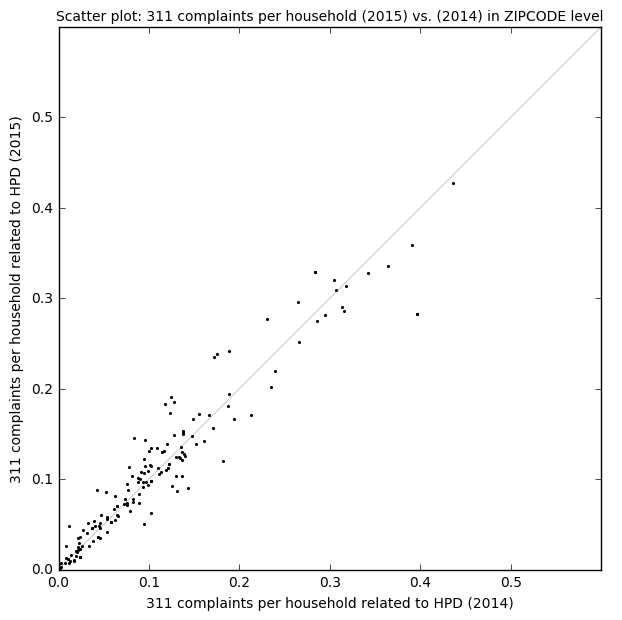

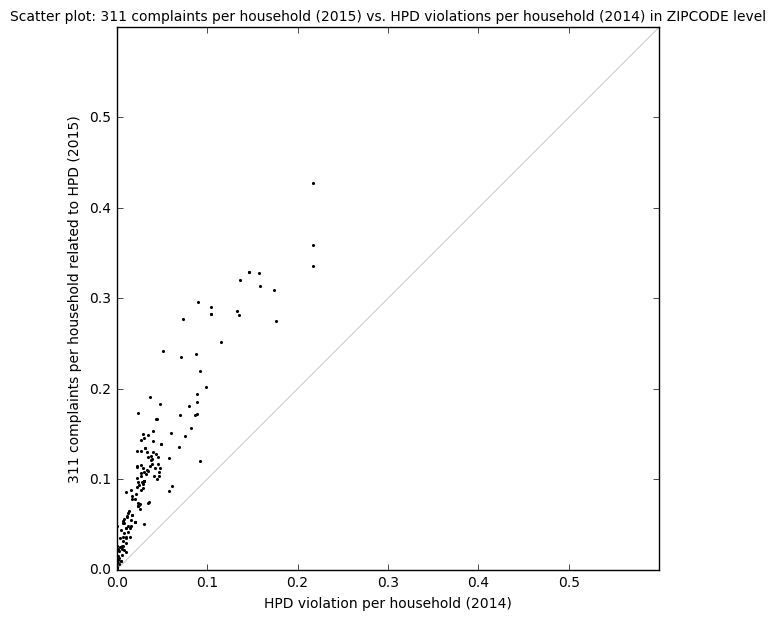

In [42]:
# Scatter plot of total complaints vs. violations

fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,11000)
#plt.ylim(-1000,11000)
plt.scatter(df_zip_clean['Com_Counts_2014'], df_zip_clean['Com_Counts'], s=5, color='k', linewidth=0)
x = range(-1000,15000)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints (2015) vs. (2014) in ZIPCODE level', size=10)
plt.ylabel('The number of 311 complaints related to HPD (2015)')
plt.xlabel('The number of 311 complaints related to HPD (2014)')


fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,11000)
#plt.ylim(-1000,11000)
plt.scatter(df_zip_clean['Vio_Counts_2014'], df_zip_clean['Com_Counts'], s=5, color='k', linewidth=0)
x = range(-1000,15000)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints (2015) vs. HPD violations (2014) in ZIPCODE level', size=10)
plt.ylabel('The number of 311 complaints related to HPD (2015)')
plt.xlabel('HPD violation (2014)')

fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(0,0.2)
plt.ylim(0,0.2)
plt.scatter(df_zip_clean['com_percapita_2014'], df_zip_clean['com_percapita'], s=5, color='k', linewidth=0)
x = range(0,2)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints per capita (2014) vs. (2015) in ZIPCODE level', size=10)
plt.ylabel('311 complaints per capita related to HPD (2015)')
plt.xlabel('311 complaints per capita related to HPD (2014)')


fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(0,0.2)
plt.ylim(0,0.2)
plt.scatter(df_zip_clean['vio_percapita_2014'], df_zip_clean['com_percapita'], s=5, color='k', linewidth=0)
x = range(0,2)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints per capita (2015) vs. HPD violations per capita (2014) in ZIPCODE level', size=10)
plt.ylabel('311 complaints per capita related to HPD (2015)')
plt.xlabel('HPD violation per capita (2014)')

fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(0,0.6)
plt.ylim(0,0.6)
plt.scatter(df_zip_clean['com_perhousehold_2014'], df_zip_clean['com_perhousehold'], s=5, color='k', linewidth=0)
x = range(0,2)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints per household (2015) vs. (2014) in ZIPCODE level', size=10)
plt.ylabel('311 complaints per household related to HPD (2015)')
plt.xlabel('311 complaints per household related to HPD (2014)')


fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(0,0.6)
plt.ylim(0,0.6)
plt.scatter(df_zip_clean['vio_perhousehold_2014'], df_zip_clean['com_perhousehold'], s=5, color='k', linewidth=0)
x = range(0,2)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.title('Scatter plot: 311 complaints per household (2015) vs. HPD violations per household (2014) in ZIPCODE level', size=10)
plt.ylabel('311 complaints per household related to HPD (2015)')
plt.xlabel('HPD violation per household (2014)')

## Fininding from scatter plot:
* Negiborhoods having higher complaints and violations in (t-1)year tend to have relatively higher complaints in (t)year
* (t-1) complaints and violations influende on (t) complaints and violations

In [43]:
X = sm.add_constant(df_zip_clean.Vio_Counts)
fit_model = sm.OLS(df_zip_clean.Com_Counts, X, missing='drop').fit()
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Com_Counts   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     1965.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          3.06e-115
Time:                        14:59:56   Log-Likelihood:                -1852.5
No. Observations:                 234   AIC:                             3709.
Df Residuals:                     232   BIC:                             3716.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
const        120.6436     53.135      2.271      0.024        15.956   225.331
Vio_Counts     1.0450      0.024     44.329      0.000         0.999     1.091
==============================================================================
Omnibus:                       42.826   Durbin-Watson:                   1.904
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              447.936
Skew:                           0.158   Prob(JB):                     5.40e-98
Kurtosis:                       9.771   Cond. No.                     2.75e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.75e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

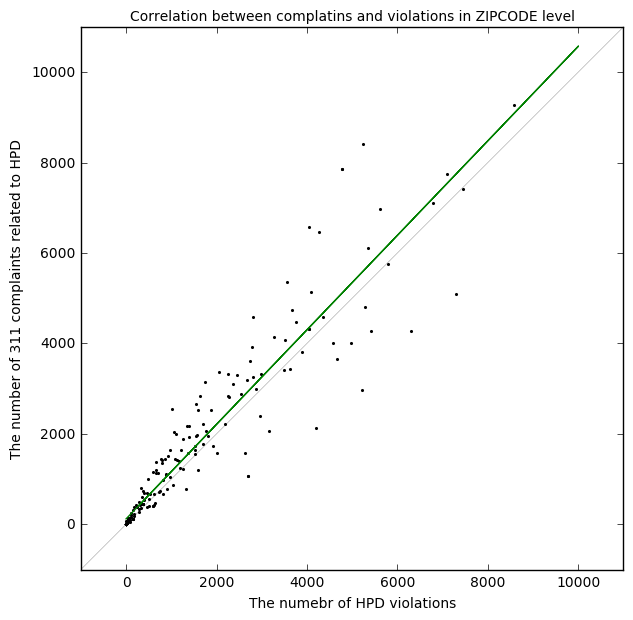

In [44]:
fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(-1000,11000)
plt.ylim(-1000,11000)
plt.scatter(df_zip_clean['Vio_Counts'], df_zip_clean['Com_Counts'], s=5, color='k', linewidth=0)
x = range(-1000,25000)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.Vio_Counts, fit_model.predict(), color='Green', label="fitted line")
plt.title('Correlation between complatins and violations in ZIPCODE level', size=10)
plt.ylabel('The number of 311 complaints related to HPD')
plt.xlabel('The numebr of HPD violations')

In [45]:
X_percapita = sm.add_constant(df_zip_clean.vio_percapita)
fit_model_percapita = sm.OLS(df_zip_clean.com_percapita, X_percapita, missing='drop').fit()
fit_model_percapita.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          com_percapita   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.871
Method:                 Least Squares   F-statistic:                     1570.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          3.00e-105
Time:                        14:59:56   Log-Likelihood:                 692.88
No. Observations:                 234   AIC:                            -1382.
Df Residuals:                     232   BIC:                            -1375.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [95.0% Conf. Int.]
---------------------------------------------------------------------------------
const             0.0031      0.001      2.887      0.004         0.001     0.005
vio_percapita     1.0476      0.026     39.623      0.000         0.996     1.100
==============================================================================
Omnibus:                       35.510   Durbin-Watson:                   1.747
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              210.602
Skew:                          -0.322   Prob(JB):                     1.85e-46
Kurtosis:                       7.603   Cond. No.                         32.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

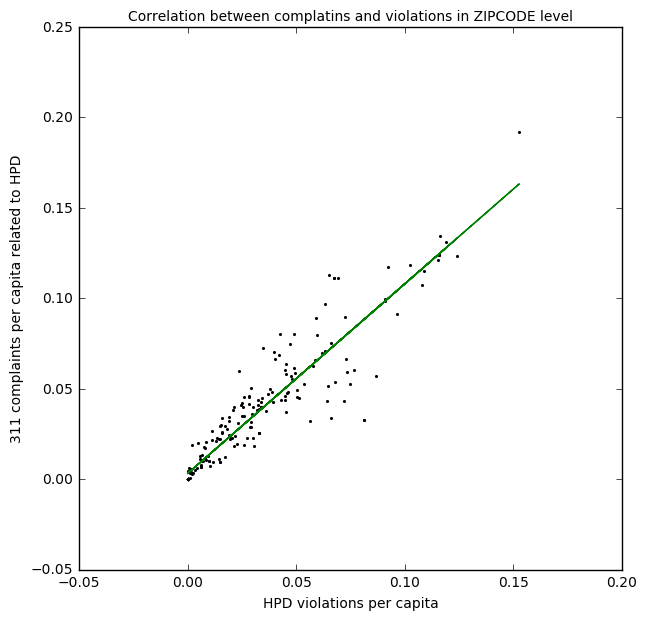

In [46]:
fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,25000)
#plt.ylim(-1000,25000)
plt.scatter(df_zip_clean['vio_percapita'], df_zip_clean['com_percapita'], s=5, color='k', linewidth=0)
#x = range(-1000,25000)
#y = x
#plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.vio_percapita, fit_model_percapita.predict(), color='Green', label="fitted line")
plt.title('Correlation between complatins and violations in ZIPCODE level', size=10)
plt.ylabel('311 complaints per capita related to HPD')
plt.xlabel('HPD violations per capita')

In [47]:
X_perhousehold = sm.add_constant(df_zip_clean.vio_perhousehold)
fit_model_perhousehold = sm.OLS(df_zip_clean.com_perhousehold, X_perhousehold, missing='drop').fit()
fit_model_perhousehold.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       com_perhousehold   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     1690.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          1.66e-108
Time:                        14:59:57   Log-Likelihood:                 479.46
No. Observations:                 234   AIC:                            -954.9
Df Residuals:                     232   BIC:                            -948.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
const                0.0081      0.003      3.000      0.003         0.003     0.013
vio_perhousehold     1.0381      0.025     41.113      0.000         0.988     1.088
==============================================================================
Omnibus:                       25.151   Durbin-Watson:                   1.782
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              117.942
Skew:                          -0.100   Prob(JB):                     2.45e-26
Kurtosis:                       6.472   Cond. No.                         12.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

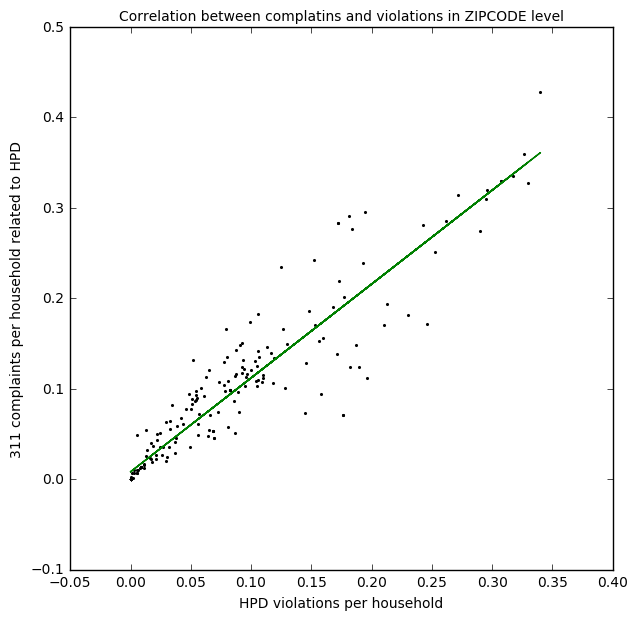

In [48]:
fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,25000)
#plt.ylim(-1000,25000)
plt.scatter(df_zip_clean['vio_perhousehold'], df_zip_clean['com_perhousehold'], s=5, color='k', linewidth=0)
#x = range(-1000,25000)
#y = x
#plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.vio_perhousehold, fit_model_perhousehold.predict(), color='Green', label="fitted line")
plt.title('Correlation between complatins and violations in ZIPCODE level', size=10)
plt.ylabel('311 complaints per household related to HPD')
plt.xlabel('HPD violations per household')

### Likelihood how many complaints result in real problem

In [49]:
X = sm.add_constant(df_zip_clean.Com_Counts)
fit_model = sm.OLS(df_zip_clean.Vio_Counts, X, missing='drop').fit()
fit_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Vio_Counts   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     1965.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          3.06e-115
Time:                        14:59:57   Log-Likelihood:                -1829.1
No. Observations:                 234   AIC:                             3662.
Df Residuals:                     232   BIC:                             3669.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
const         32.9819     48.572      0.679      0.498       -62.716   128.680
Com_Counts     0.8559      0.019     44.329      0.000         0.818     0.894
==============================================================================
Omnibus:                       89.022   Durbin-Watson:                   1.849
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              575.695
Skew:                           1.331   Prob(JB):                    9.76e-126
Kurtosis:                      10.209   Cond. No.                     3.10e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.1e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

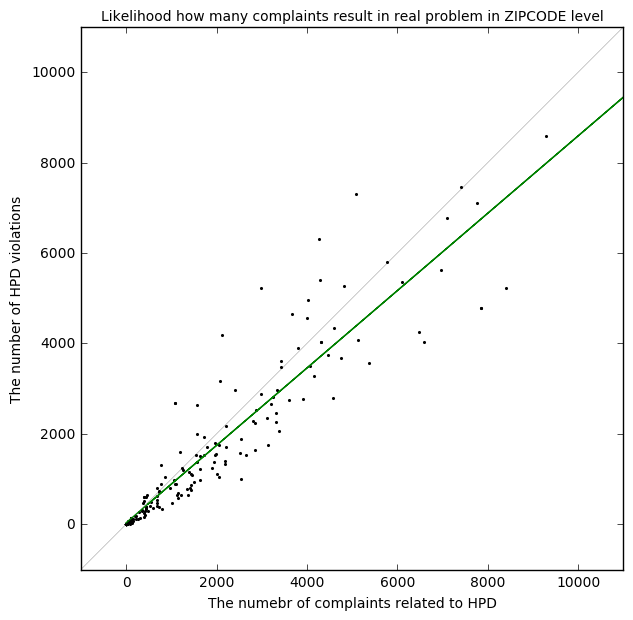

In [50]:
fig, ax = plt.subplots(figsize = (7,7))
plt.xlim(-1000,11000)
plt.ylim(-1000,11000)
plt.scatter(df_zip_clean['Com_Counts'], df_zip_clean['Vio_Counts'], s=5, color='k', linewidth=0)
x = range(-1000,25000)
y = x
plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.Com_Counts, fit_model.predict(), color='Green', label="fitted line")
plt.title('Likelihood how many complaints result in real problem in ZIPCODE level', size=10)
plt.ylabel('The number of HPD violations')
plt.xlabel('The numebr of complaints related to HPD')

In [51]:
X_percapita = sm.add_constant(df_zip_clean.com_percapita)
fit_model_percapita = sm.OLS(df_zip_clean.vio_percapita, X_percapita, missing='drop').fit()
fit_model_percapita.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          vio_percapita   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.871
Method:                 Least Squares   F-statistic:                     1570.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          3.00e-105
Time:                        14:59:57   Log-Likelihood:                 719.89
No. Observations:                 234   AIC:                            -1436.
Df Residuals:                     232   BIC:                            -1429.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [95.0% Conf. Int.]
---------------------------------------------------------------------------------
const             0.0008      0.001      0.863      0.389        -0.001     0.003
com_percapita     0.8317      0.021     39.623      0.000         0.790     0.873
==============================================================================
Omnibus:                       82.277   Durbin-Watson:                   1.621
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              355.125
Skew:                           1.359   Prob(JB):                     7.69e-78
Kurtosis:                       8.388   Cond. No.                         28.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

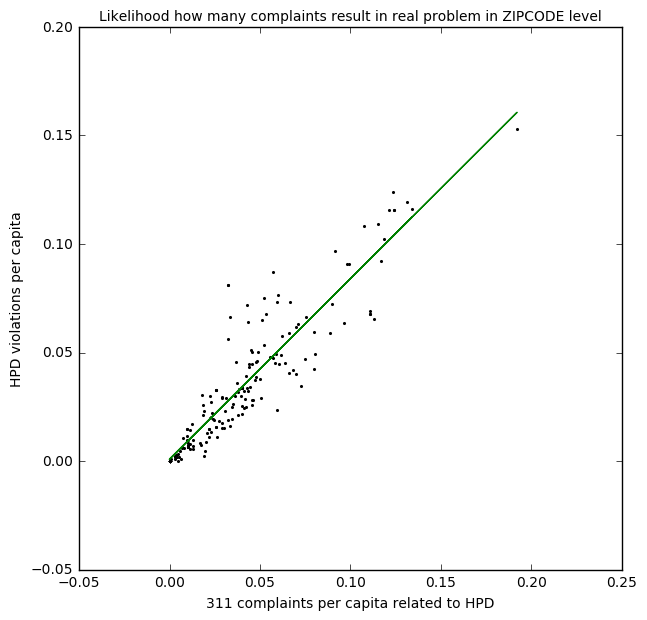

In [52]:
fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,25000)
#plt.ylim(-1000,25000)
plt.scatter(df_zip_clean['com_percapita'], df_zip_clean['vio_percapita'], s=5, color='k', linewidth=0)
#x = range(-1000,25000)
#y = x
#plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.com_percapita, fit_model_percapita.predict(), color='Green', label="fitted line")
plt.title('Likelihood how many complaints result in real problem in ZIPCODE level', size=10)
plt.xlabel('311 complaints per capita related to HPD')
plt.ylabel('HPD violations per capita')

In [53]:
X_perhousehold = sm.add_constant(df_zip_clean.com_perhousehold)
fit_model_perhousehold = sm.OLS(df_zip_clean.vio_perhousehold, X_perhousehold, missing='drop').fit()
fit_model_perhousehold.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       vio_perhousehold   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     1690.
Date:                Mon, 05 Dec 2016   Prob (F-statistic):          1.66e-108
Time:                        14:59:58   Log-Likelihood:                 503.27
No. Observations:                 234   AIC:                            -1003.
Df Residuals:                     232   BIC:                            -995.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------------
const                0.0015      0.002      0.604      0.546        -0.003     0.006
com_perhousehold     0.8470      0.021     41.113      0.000         0.806     0.888
==============================================================================
Omnibus:                       60.830   Durbin-Watson:                   1.704
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              188.083
Skew:                           1.085   Prob(JB):                     1.44e-41
Kurtosis:                       6.819   Cond. No.                         11.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

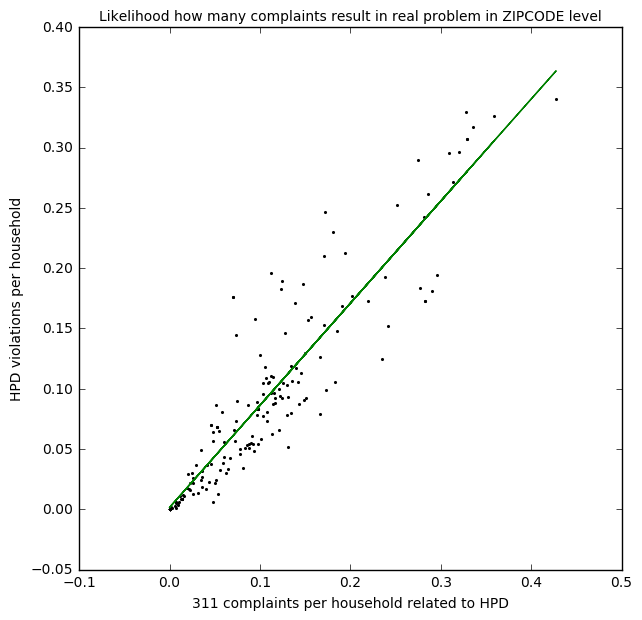

In [54]:
fig, ax = plt.subplots(figsize = (7,7))
#plt.xlim(-1000,25000)
#plt.ylim(-1000,25000)
plt.scatter(df_zip_clean['com_perhousehold'], df_zip_clean['vio_perhousehold'], s=5, color='k', linewidth=0)
#x = range(-1000,25000)
#y = x
#plt.plot(x, y, color='k', alpha=0.5, linewidth=0.3)
plt.plot(df_zip_clean.com_perhousehold, fit_model_perhousehold.predict(), color='Green', label="fitted line")
plt.title('Likelihood how many complaints result in real problem in ZIPCODE level', size=10)
plt.xlabel('311 complaints per household related to HPD')
plt.ylabel('HPD violations per household')

# Ratio of complaints / violations (excluding outliers)
* ratio(com/vio) > 1.0 means people tend to report more complaints than actual problem, or there is realtviely less actual problem
* ratio(com/vio) < 1.0 means there are relatively higher actual problems or people tend to report less complaints than actual problems

In [55]:
df_zip_clean['ratio(com/vio)'] = df_zip_clean['Com_Counts'] / df_zip_clean['Vio_Counts']

In [56]:
df_zip_clean[['ZIPCODE', 'POP', 'HOUSEHOLD', 'Com_Counts', 'Vio_Counts', 'com_percapita', 'vio_percapita', 
        'com_perhousehold', 'vio_perhousehold', 'ratio(com/vio)']].head()

,ZIPCODE,POP,HOUSEHOLD,Com_Counts,Vio_Counts,com_percapita,vio_percapita,com_perhousehold,vio_perhousehold,ratio(com/vio)
0,11436,18610.0,5398.0,485.0,296.0,0.025961,0.015844,0.089848,0.054835,1.638514
2,11212,87752.0,30687.0,11018.0,10005.0,0.131375,0.119296,0.359045,0.326034,1.101249
4,11218,75133.0,24831.0,4815.0,5280.0,0.066615,0.073048,0.193911,0.212637,0.911932
6,11219,98720.0,26613.0,2981.0,5222.0,0.032205,0.056416,0.112013,0.196220,0.570854
7,11210,67043.0,21908.0,6476.0,4257.0,0.096559,0.063473,0.295600,0.194313,1.521259


In [57]:
# ratio(com/vio)

df_zip_clean_2 = df_zip_clean.loc[df_zip_clean['ratio(com/vio)'] < 10.0]
print 'ratio(com/vio) is not nan or inf: ', len(df_zip_clean_2)

ratio(com/vio) is not nan or inf:  165


In [58]:
df_zip_more = df_zip_clean.loc[df_zip_clean['ratio(com/vio)'] >= 1.0]
df_zip_less = df_zip_clean.loc[df_zip_clean['ratio(com/vio)'] < 1.0]

print 'ratio(com/vio) > 1.0: ', len(df_zip_more)
print 'ratio(com/vio) < 1.0: ', len(df_zip_less)

ratio(com/vio) > 1.0:  127
ratio(com/vio) < 1.0:  39


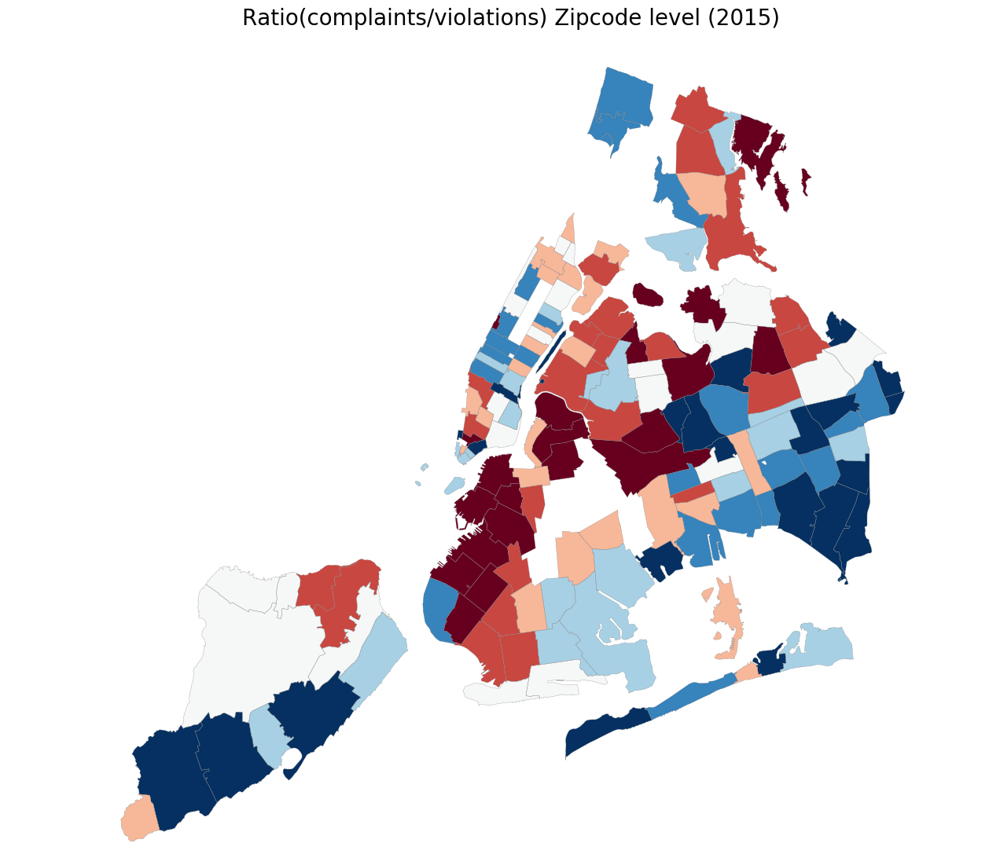

In [59]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
#df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
df_zip_clean_2.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'RdBu', alpha=1.0, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) Zipcode level (2015)', size=20)

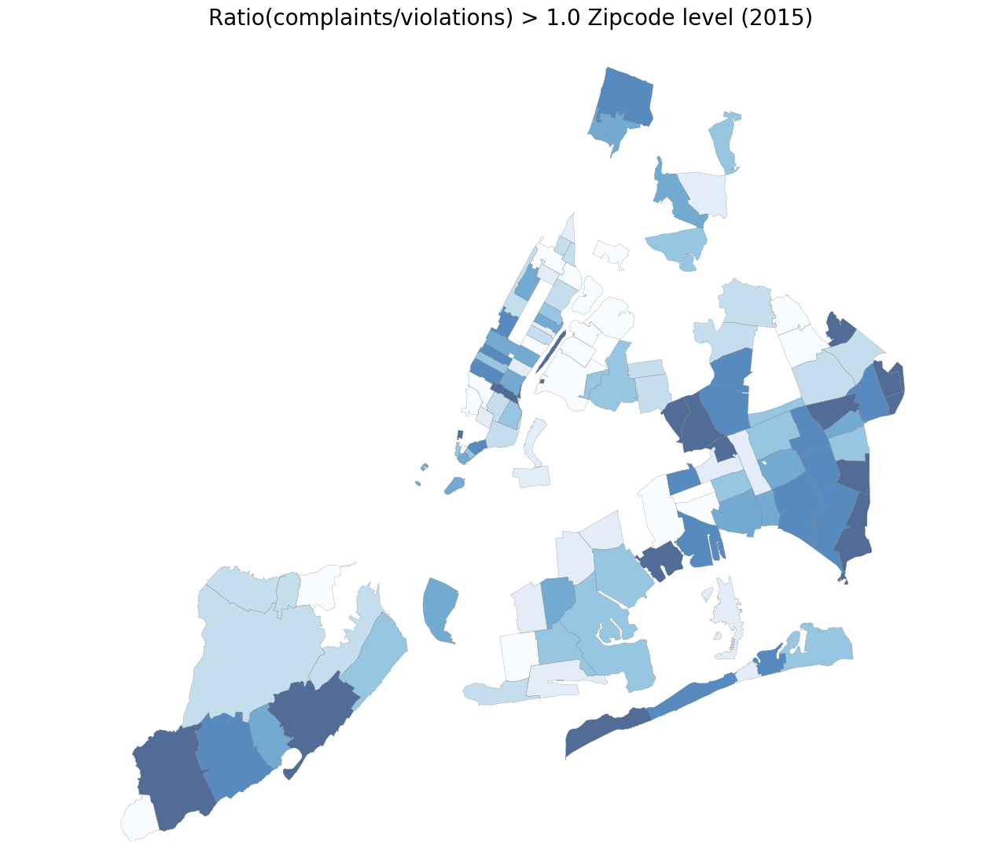

In [60]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
#df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
df_zip_more.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
#df_zip_less.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'hot', alpha=0.7, 
                #edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) > 1.0 Zipcode level (2015)', size=20)

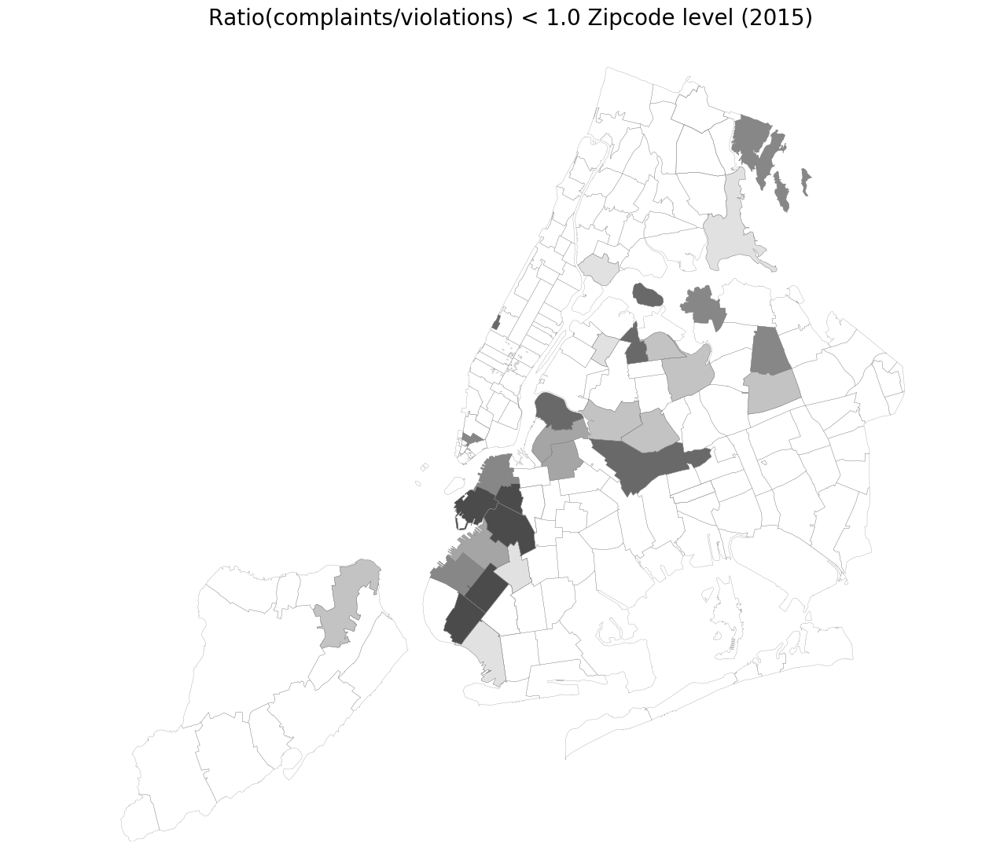

In [61]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
#df_zip_more.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                #edgecolor = 'Grey', linewidth = 0.2)
df_zip_less.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'gray', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) < 1.0 Zipcode level (2015)', size=20)

# Ratio of complaints / violations (including outliers)
* ratio(com/vio) > 1.0 means people tend to report more complaints than actual problem, or there is realtviely less actual problem
* ratio(com/vio) < 1.0 means there are relatively higher actual problems or people tend to report less complaints than actual problems

In [62]:
df_zip['ratio(com/vio)'] = df_zip['Com_Counts'] / df_zip['Vio_Counts']

In [63]:
# ratio(com/vio)

df_zip_2 = df_zip.loc[df_zip['ratio(com/vio)'] < 10.0]
print 'ratio(com/vio) is not nan or inf: ', len(df_zip_2)

ratio(com/vio) is not nan or inf:  192


In [64]:
df_zip_more = df_zip.loc[df_zip['ratio(com/vio)'] >= 1.0]
df_zip_less = df_zip.loc[df_zip['ratio(com/vio)'] < 1.0]

print 'ratio(com/vio) > 1.0: ', len(df_zip_more)
print 'ratio(com/vio) < 1.0: ', len(df_zip_less)

ratio(com/vio) > 1.0:  147
ratio(com/vio) < 1.0:  48


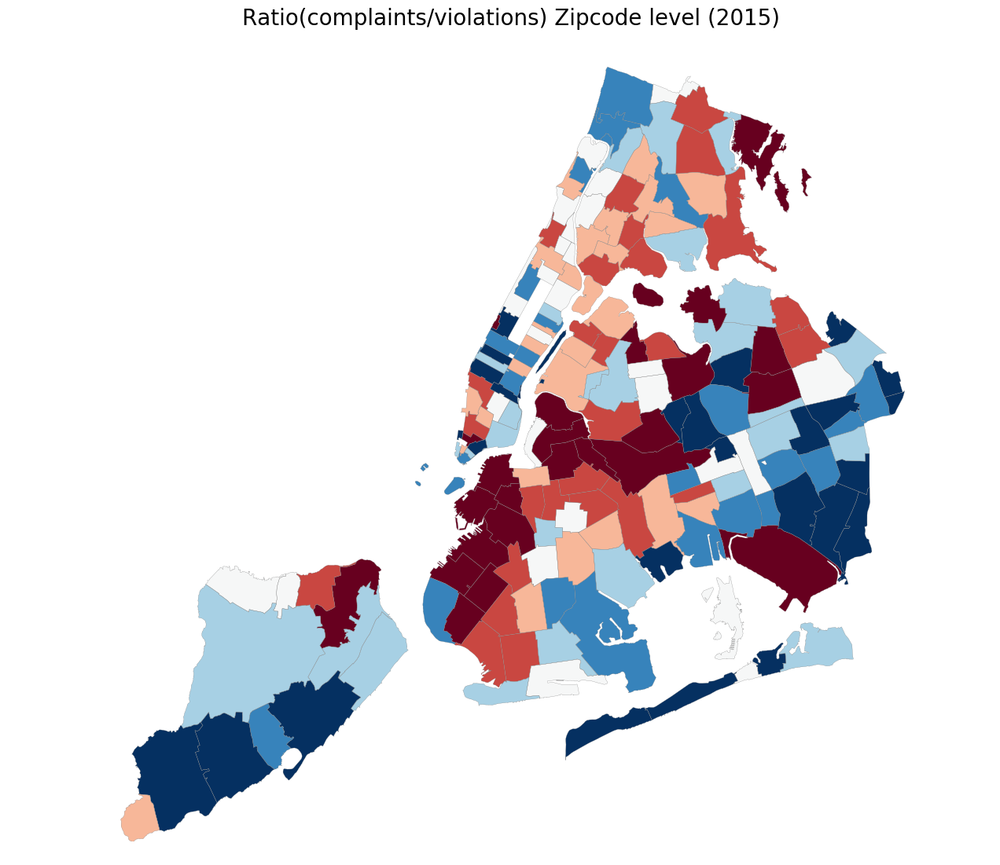

In [65]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
#df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
df_zip_2.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'RdBu', alpha=1.0, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) Zipcode level (2015)', size=20)

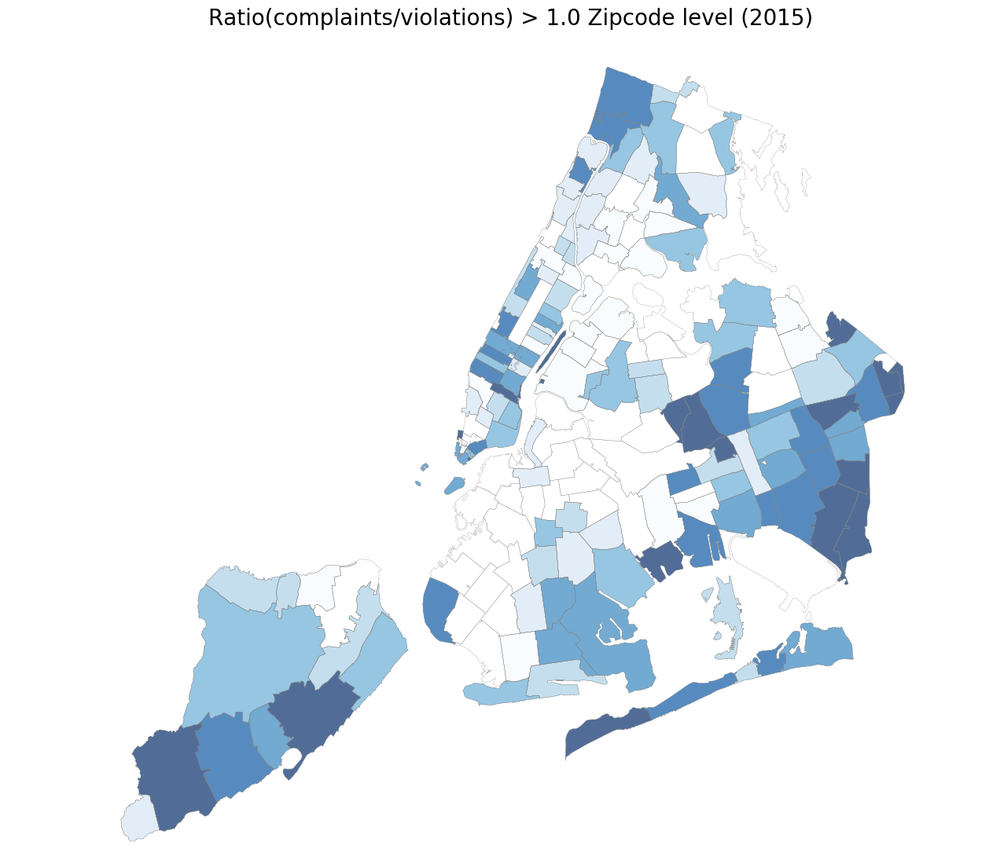

In [66]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
#df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
df_zip_more.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
#df_zip_less.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'hot', alpha=0.7, 
                #edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) > 1.0 Zipcode level (2015)', size=20)

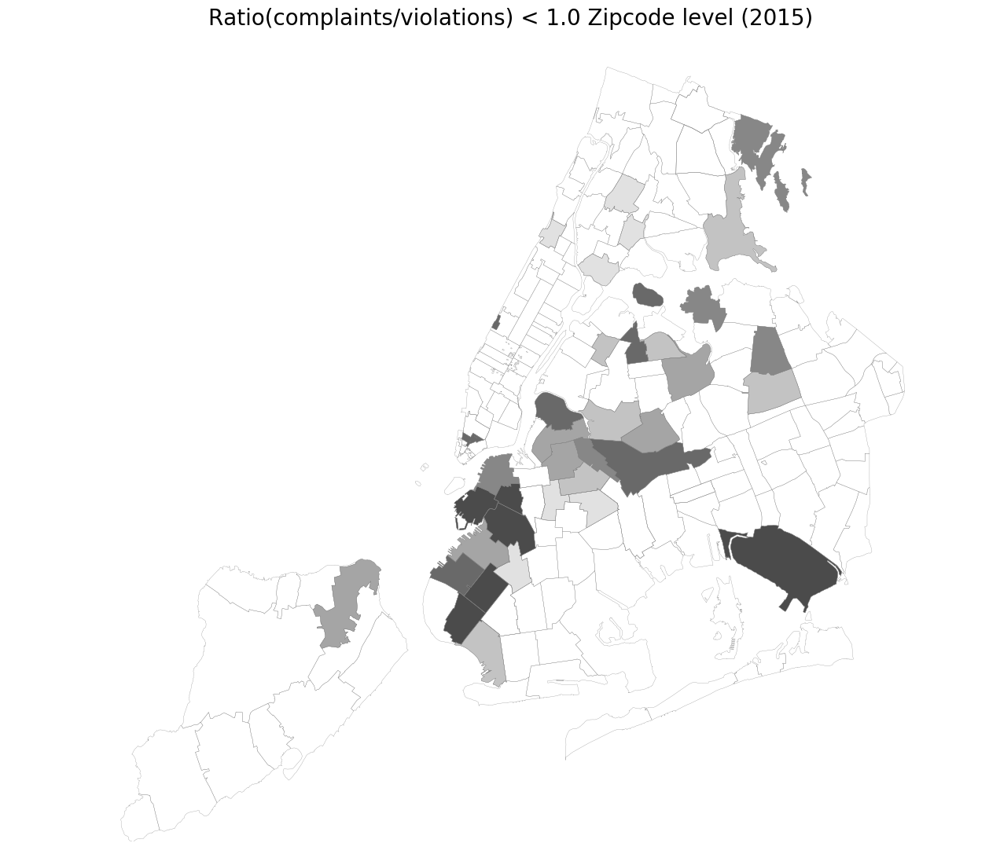

In [67]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_zip.plot(ax = ax, alpha=0, edgecolor = 'Grey', linewidth = 0.2)
#df_zip_more.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'Blues', alpha=0.7, 
                #edgecolor = 'Grey', linewidth = 0.2)
df_zip_less.plot(column = 'ratio(com/vio)', ax = ax, scheme='QUANTILES', k=7, colormap = 'gray', alpha=0.7, 
                edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Ratio(complaints/violations) < 1.0 Zipcode level (2015)', size=20)

# What's next:
* (t-1) violations data : already including above
* (t-1) complaints data : already including above
* Clustering (reproducibility)
* data collection (influencing feature) : ACS, MapPLUTO, Housing Vacancy Survey etc.
    * Avg built age
    * Elderly pop
    * Education level
    * Income level
    * Household with children
    * Language (non-English pop)
    * 
* modeling (stating from simple one)

# Clustering based on complaints per household (excluding outliers)

In [68]:
#df_cl = df_zip_clean[['ZIPCODE', 'HOUSEHOLD', 'HEAT/HOT WATER', 'UNSANITARY CONDITION', 
                      #'PAINT/PLASTER', 'DOOR/WINDOW', 'WATER LEAK', 'ELECTRIC', 'FLOORING/STAIRS', 
                      #'GENERAL', 'APPLIANCE', 'SAFETY']]

col_list = ['HEAT/HOT WATER', 'UNSANITARY CONDITION', 
                      'PAINT/PLASTER', 'DOOR/WINDOW', 'WATER LEAK', 'ELECTRIC', 'FLOORING/STAIRS', 
                      'GENERAL', 'APPLIANCE', 'SAFETY']

for i in col_list:
    df_zip_clean[i + '_perhousehold'] = df_zip_clean[i] / df_zip_clean['HOUSEHOLD']
    
df_zip_clean.head()

,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,...,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
0,2.269930e+07,0,Queens,081,18682.0,Jamaica,0.0,0.0,NY,36,...,0.022601,0.015932,0.008892,0.005743,0.006113,0.006113,0.002408,0.004446,0.002594,0.000926
2,4.197210e+07,0,Kings,047,83867.0,Brooklyn,0.0,0.0,NY,36,...,0.119790,0.050152,0.041060,0.026330,0.023332,0.019063,0.014729,0.016554,0.006746,0.005051
4,3.686880e+07,0,Kings,047,72281.0,Brooklyn,0.0,0.0,NY,36,...,0.067496,0.025251,0.024486,0.012887,0.011035,0.008900,0.011397,0.006564,0.003705,0.002537
6,4.200274e+07,0,Kings,047,92562.0,Brooklyn,0.0,0.0,NY,36,...,0.034006,0.014053,0.016082,0.009093,0.006651,0.006087,0.006501,0.003983,0.001804,0.001691
7,4.788702e+07,0,Kings,047,67068.0,Brooklyn,0.0,0.0,NY,36,...,0.092432,0.043637,0.042359,0.020951,0.021088,0.015063,0.015291,0.008810,0.005706,0.003697


In [69]:
data = df_zip_clean[['ZIPCODE', 'HEAT/HOT WATER_perhousehold', 'UNSANITARY CONDITION_perhousehold', 
            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 'WATER LEAK_perhousehold', 
            'ELECTRIC_perhousehold', 'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
            'APPLIANCE_perhousehold', 'SAFETY_perhousehold']]

In [70]:
from sklearn.cluster import KMeans
from scipy import stats
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap

In [71]:
data.columns.tolist()

[u'ZIPCODE',
 'HEAT/HOT WATER_perhousehold',
 'UNSANITARY CONDITION_perhousehold',
 'PAINT/PLASTER_perhousehold',
 'DOOR/WINDOW_perhousehold',
 'WATER LEAK_perhousehold',
 'ELECTRIC_perhousehold',
 'FLOORING/STAIRS_perhousehold',
 'GENERAL_perhousehold',
 'APPLIANCE_perhousehold',
 'SAFETY_perhousehold']

In [72]:
df_new = data[['HEAT/HOT WATER_perhousehold', 'UNSANITARY CONDITION_perhousehold', 
            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 'WATER LEAK_perhousehold', 
            'ELECTRIC_perhousehold', 'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
            'APPLIANCE_perhousehold', 'SAFETY_perhousehold']]

In [73]:
df_new['Total']=df_new.sum(axis=1)

In [74]:
df_new = df_new.loc[df_new['Total']>0]
df_new.tail()

,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold,Total
256,0.059783,0.017749,0.010457,0.010457,0.009838,0.006673,0.006535,0.044441,0.001789,0.002064,0.169785
257,0.019170,0.011947,0.004167,0.003427,0.001852,0.002778,0.002037,0.002223,0.002315,0.002315,0.052232
258,0.013351,0.014185,0.008106,0.007867,0.005126,0.008106,0.005364,0.005126,0.003099,0.002861,0.073191
259,0.027117,0.016670,0.010669,0.004445,0.009335,0.008669,0.003779,0.004668,0.001111,0.001556,0.088020
260,0.071088,0.011848,0.010805,0.005592,0.004265,0.025402,0.002938,0.004455,0.002938,0.004170,0.143503


In [75]:
df_new = df_new.drop('Total', 1)
df_new.tail()

,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
256,0.059783,0.017749,0.010457,0.010457,0.009838,0.006673,0.006535,0.044441,0.001789,0.002064
257,0.019170,0.011947,0.004167,0.003427,0.001852,0.002778,0.002037,0.002223,0.002315,0.002315
258,0.013351,0.014185,0.008106,0.007867,0.005126,0.008106,0.005364,0.005126,0.003099,0.002861
259,0.027117,0.016670,0.010669,0.004445,0.009335,0.008669,0.003779,0.004668,0.001111,0.001556
260,0.071088,0.011848,0.010805,0.005592,0.004265,0.025402,0.002938,0.004455,0.002938,0.004170


In [76]:
n_list=df_new.columns.tolist()

In [77]:
n_list_fake=list(range(len(n_list)))

In [78]:
myarray = df_new.as_matrix()
print myarray

[[ 0.02260096  0.01593183  0.00889218 ...,  0.00444609  0.00259355
   0.00092627]
 [ 0.11979014  0.05015153  0.04105973 ...,  0.01655424  0.00674553
   0.005051  ]
 [ 0.06749627  0.02525069  0.02448552 ...,  0.00656438  0.00370505
   0.00253715]
 ..., 
 [ 0.01335082  0.01418524  0.00810585 ...,  0.00512576  0.0030993
   0.00286089]
 [ 0.02711714  0.01667037  0.01066904 ...,  0.0046677   0.00111136
   0.0015559 ]
 [ 0.07108806  0.01184801  0.01080539 ...,  0.00445485  0.00293831
   0.0041705 ]]


In [79]:
myarray.shape

(166, 10)

In [80]:
#Z-score normalized 
myarray_norm = np.zeros([166,10])

for i in range(len(myarray)):
    myarray_norm[i] = stats.zscore(myarray[i])
    
print myarray_norm.shape
print myarray_norm.mean(axis=1)
print myarray_norm.std(axis=1)

(166, 10)
[  3.77475828e-16   0.00000000e+00   1.11022302e-16   1.88737914e-16
  -9.99200722e-17  -1.11022302e-16  -2.22044605e-17   1.11022302e-17
   9.99200722e-17   7.77156117e-17   6.66133815e-17   1.11022302e-16
   9.99200722e-17   7.77156117e-17   5.55111512e-17   2.22044605e-17
   1.11022302e-16   1.11022302e-16   2.22044605e-17  -6.66133815e-17
  -9.99200722e-17  -1.33226763e-16  -5.55111512e-17  -7.77156117e-17
  -5.55111512e-17  -1.11022302e-17   8.88178420e-17   1.55431223e-16
  -8.88178420e-17  -4.44089210e-17   3.33066907e-17   5.55111512e-17
  -9.99200722e-17   5.55111512e-17  -2.22044605e-17  -2.22044605e-17
  -9.99200722e-17  -7.77156117e-17   0.00000000e+00   1.11022302e-16
  -7.77156117e-17   3.33066907e-17  -2.22044605e-17   6.66133815e-17
   1.11022302e-17  -2.22044605e-17   1.22124533e-16  -2.22044605e-17
   1.77635684e-16   0.00000000e+00  -8.88178420e-17  -1.11022302e-17
  -1.88737914e-16   4.44089210e-17  -8.88178420e-17  -5.55111512e-17
   1.11022302e-17  -1.11

In [81]:
colors=['C', 'M', 'Y', 'B']

Kc4 = KMeans(n_clusters=4, n_init=50)
Kc4.fit(myarray_norm)

group_Kc4=Kc4.predict(myarray_norm)

group_Kc4_N = np.zeros([4,166])
for n in range(4):
    for i in range(len(myarray_norm)):
        if group_Kc4[i]==n:
            group_Kc4_N[n][i]=1
        else:
            group_Kc4_N[n][i]=0

meancenter4 = np.zeros([4,10])

for n in range(len(group_Kc4_N)):
    
    for i in range(len(myarray_norm[0])): #20
    
        A=[]
        for j in range(len(myarray_norm)): #243
            a=myarray_norm[j][i]*group_Kc4_N[n][j]
            A.append(a)
    
        meancenter4[n][i]=sum(A)/sum(group_Kc4_N[n])

In [82]:
len(n_list_fake)

10

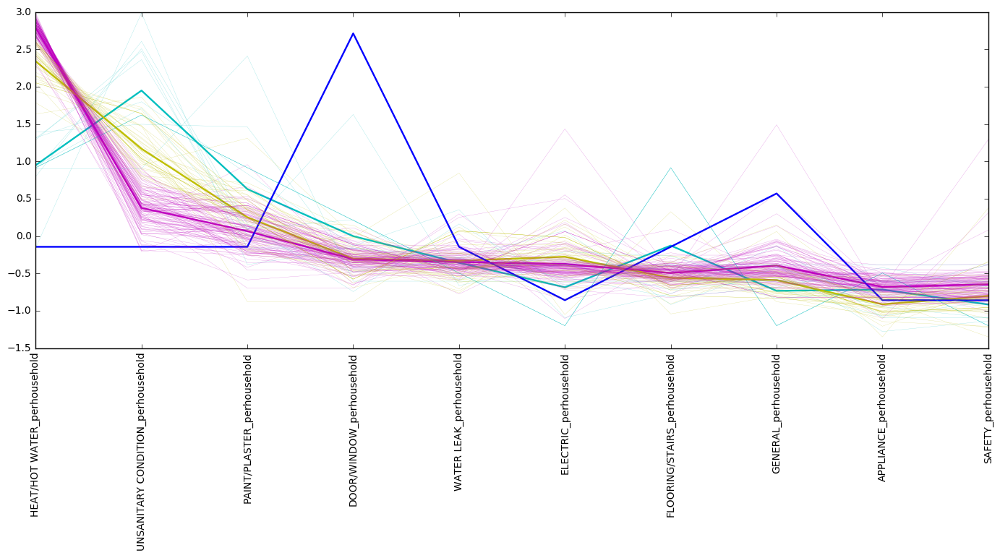

In [83]:
fig = plt.figure(figsize=(17, 6))
#plt.ylabel('#of Business in zipcode level (normalized)', fontsize=15)
#plt.xlabel('311 Complaints Types related to HPD', fontsize=15)
#plt.xlim(0,11)
#plt.ylim(-1,4)
plt.xticks(n_list_fake[0:10], n_list[0:10], rotation='vertical')

for i in range(len(group_Kc4_N)):
    plt.plot(n_list_fake,meancenter4[i], color=colors[i], linewidth=1.7)

for i in range(len(myarray_norm)):
    for n in range(4):
        if group_Kc4[i]==n:
            plt.plot(n_list_fake,myarray_norm[i], color=colors[n] , alpha=0.5, linewidth=0.2)

In [84]:
df_new['Cluster'] = group_Kc4
df_new['Cluster'] = df_new['Cluster'] + 1.0

In [85]:
df_cluster = pd.merge(df_zip_clean, df_new, how='left', on=['HEAT/HOT WATER_perhousehold', 
                                                            'UNSANITARY CONDITION_perhousehold',
                                                            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 
                                                            'WATER LEAK_perhousehold', 'ELECTRIC_perhousehold', 
                                                            'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
                                                            'APPLIANCE_perhousehold', 'SAFETY_perhousehold'])

In [86]:
df_cluster = df_cluster.drop_duplicates('ZIPCODE')
df_cluster = df_cluster.loc[df_cluster['Cluster'] > 0]

In [87]:
zipcode = gpd.read_file('data/ZIP_CODE_040114/ZIP_CODE_040114.shp')

In [88]:
df_cluster_zip = pd.merge(zipcode, df_cluster, how='left', on=['ZIPCODE'])

In [89]:
df_cluster_zip = df_cluster_zip.dropna(subset=['Cluster'])

In [90]:
df_cluster_zip.Cluster.value_counts()

2.0    110
3.0     42
1.0     13
4.0      1
Name: Cluster, dtype: int64

In [91]:
def make_colormap(seq):
    """Return a LinearSegmentedColormap
    seq: a sequence of floats and RGB-tuples. The floats should be increasing
    and in the interval (0,1).
    """
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

In [92]:
c = mcolors.ColorConverter().to_rgb
cmyb = make_colormap([c('red'), c('yellow'),c('blue'), c('green')])

In [93]:
vmax = 3.0
cmap = LinearSegmentedColormap.from_list('mycmap', [(0 / vmax, 'c'),
                                                    (1 / vmax, 'm'),
                                                    (2 / vmax, 'y'),
                                                    (3 / vmax, 'b')]
                                        )

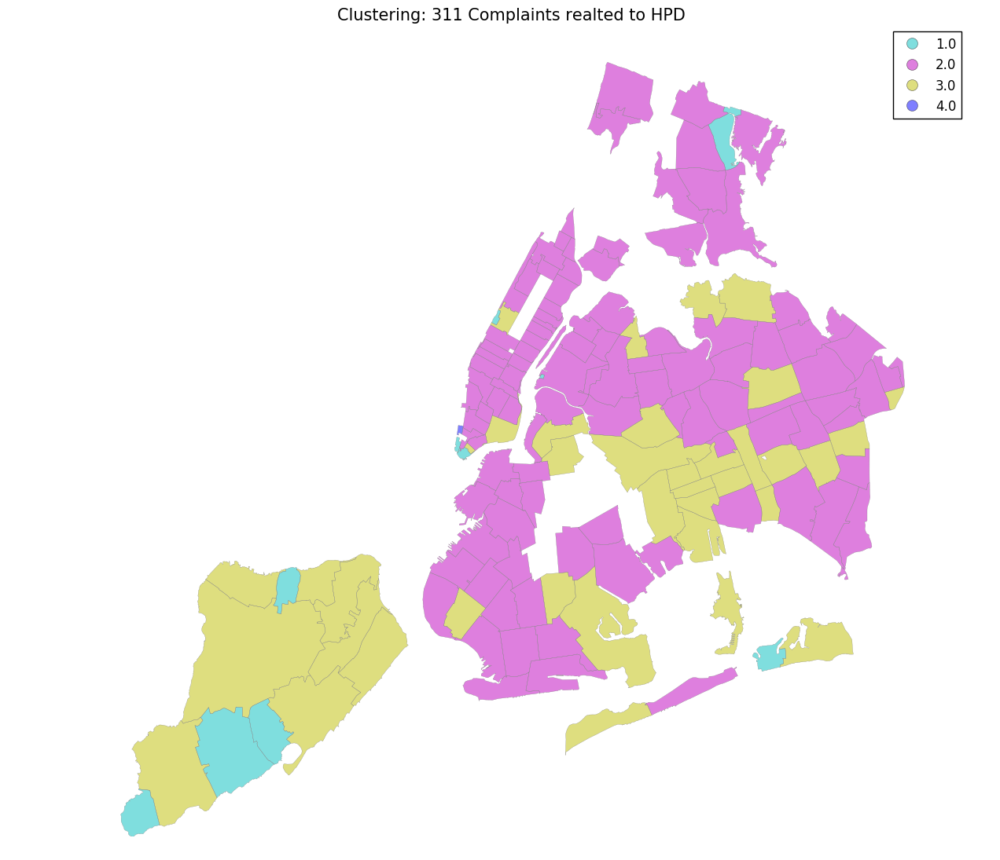

In [94]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_cluster.plot(column = 'Cluster', ax = ax, categorical=True, cmap=cmap, legend=True,
                 edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Clustering: 311 Complaints realted to HPD', size=15)

* Once excluding outliers in terms of the numebr of complaints, violations, per capita, and per household, most neighborhood in northern Manhattan, southern Bronx, and middle of Brooklyns are not showing at the result of clustering. 
* Re-do including outliers

# Clustering based on complaints per household (including outliers)

In [95]:
col_list = ['HEAT/HOT WATER', 'UNSANITARY CONDITION', 
                      'PAINT/PLASTER', 'DOOR/WINDOW', 'WATER LEAK', 'ELECTRIC', 'FLOORING/STAIRS', 
                      'GENERAL', 'APPLIANCE', 'SAFETY']

for i in col_list:
    df_zip[i + '_perhousehold'] = df_zip[i] / df_zip['HOUSEHOLD']
    
df_zip.head()

,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,...,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
0,2.269930e+07,0,Queens,081,18682.0,Jamaica,0.0,0.0,NY,36,...,0.022601,0.015932,0.008892,0.005743,0.006113,0.006113,0.002408,0.004446,0.002594,0.000926
1,2.963100e+07,0,Kings,047,62427.0,Brooklyn,0.0,0.0,NY,36,...,0.174503,0.066658,0.057365,0.035652,0.035061,0.025683,0.026063,0.019347,0.006970,0.006294
2,4.197210e+07,0,Kings,047,83867.0,Brooklyn,0.0,0.0,NY,36,...,0.119790,0.050152,0.041060,0.026330,0.023332,0.019063,0.014729,0.016554,0.006746,0.005051
3,2.369863e+07,0,Kings,047,56528.0,Brooklyn,0.0,0.0,NY,36,...,0.174403,0.060504,0.065374,0.032336,0.034530,0.024702,0.028826,0.020621,0.008424,0.005879
4,3.686880e+07,0,Kings,047,72281.0,Brooklyn,0.0,0.0,NY,36,...,0.067496,0.025251,0.024486,0.012887,0.011035,0.008900,0.011397,0.006564,0.003705,0.002537


In [96]:
data = df_zip[['ZIPCODE', 'HEAT/HOT WATER_perhousehold', 'UNSANITARY CONDITION_perhousehold', 
            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 'WATER LEAK_perhousehold', 
            'ELECTRIC_perhousehold', 'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
            'APPLIANCE_perhousehold', 'SAFETY_perhousehold']]

In [97]:
data.columns.tolist()

[u'ZIPCODE',
 'HEAT/HOT WATER_perhousehold',
 'UNSANITARY CONDITION_perhousehold',
 'PAINT/PLASTER_perhousehold',
 'DOOR/WINDOW_perhousehold',
 'WATER LEAK_perhousehold',
 'ELECTRIC_perhousehold',
 'FLOORING/STAIRS_perhousehold',
 'GENERAL_perhousehold',
 'APPLIANCE_perhousehold',
 'SAFETY_perhousehold']

In [98]:
df_new = data[['HEAT/HOT WATER_perhousehold', 'UNSANITARY CONDITION_perhousehold', 
            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 'WATER LEAK_perhousehold', 
            'ELECTRIC_perhousehold', 'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
            'APPLIANCE_perhousehold', 'SAFETY_perhousehold']]

In [99]:
df_new['Total']=df_new.sum(axis=1)

In [100]:
df_new = df_new.loc[df_new['Total']>0]
df_new.tail()

,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold,Total
257,0.019170,0.011947,0.004167,0.003427,0.001852,0.002778,0.002037,0.002223,0.002315,0.002315,0.052232
258,0.013351,0.014185,0.008106,0.007867,0.005126,0.008106,0.005364,0.005126,0.003099,0.002861,0.073191
259,0.027117,0.016670,0.010669,0.004445,0.009335,0.008669,0.003779,0.004668,0.001111,0.001556,0.088020
260,0.071088,0.011848,0.010805,0.005592,0.004265,0.025402,0.002938,0.004455,0.002938,0.004170,0.143503
261,0.000000,0.001511,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001511


In [101]:
df_new = df_new.drop('Total', 1)
df_new.tail()

,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
257,0.019170,0.011947,0.004167,0.003427,0.001852,0.002778,0.002037,0.002223,0.002315,0.002315
258,0.013351,0.014185,0.008106,0.007867,0.005126,0.008106,0.005364,0.005126,0.003099,0.002861
259,0.027117,0.016670,0.010669,0.004445,0.009335,0.008669,0.003779,0.004668,0.001111,0.001556
260,0.071088,0.011848,0.010805,0.005592,0.004265,0.025402,0.002938,0.004455,0.002938,0.004170
261,0.000000,0.001511,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [102]:
n_list=df_new.columns.tolist()

In [103]:
n_list_fake=list(range(len(n_list)))

In [104]:
myarray = df_new.as_matrix()
print myarray

[[ 0.02260096  0.01593183  0.00889218 ...,  0.00444609  0.00259355
   0.00092627]
 [ 0.1745026   0.06665822  0.05736493 ...,  0.01934694  0.00696997
   0.00629409]
 [ 0.11979014  0.05015153  0.04105973 ...,  0.01655424  0.00674553
   0.005051  ]
 ..., 
 [ 0.02711714  0.01667037  0.01066904 ...,  0.0046677   0.00111136
   0.0015559 ]
 [ 0.07108806  0.01184801  0.01080539 ...,  0.00445485  0.00293831
   0.0041705 ]
 [ 0.          0.00151057  0.         ...,  0.          0.          0.        ]]


In [105]:
myarray.shape

(194, 10)

In [106]:
#Z-score normalized 
myarray_norm = np.zeros([194,10])

for i in range(len(myarray)):
    myarray_norm[i] = stats.zscore(myarray[i])
    
print myarray_norm.shape
print myarray_norm.mean(axis=1)
print myarray_norm.std(axis=1)

(194, 10)
[  3.77475828e-16  -1.11022302e-17   0.00000000e+00   1.22124533e-16
   1.11022302e-16  -8.88178420e-17   1.88737914e-16  -9.99200722e-17
  -1.11022302e-16  -2.22044605e-17   1.11022302e-17   0.00000000e+00
   9.99200722e-17   3.33066907e-17   7.77156117e-17   6.66133815e-17
   1.11022302e-16   9.99200722e-17   9.99200722e-17   7.77156117e-17
   9.99200722e-17  -2.44249065e-16  -2.22044605e-17   5.55111512e-17
   6.66133815e-17  -4.44089210e-17   2.22044605e-17   1.11022302e-16
   1.11022302e-16   2.22044605e-17   5.55111512e-17   6.66133815e-17
  -1.44328993e-16  -3.33066907e-17   1.11022302e-17   1.11022302e-16
  -4.44089210e-16  -6.66133815e-17   6.66133815e-17   2.22044605e-16
  -9.99200722e-17  -1.33226763e-16  -5.55111512e-17  -3.33066907e-17
  -7.77156117e-17  -5.55111512e-17  -1.11022302e-17   8.88178420e-17
   1.55431223e-16  -8.88178420e-17  -4.44089210e-17   3.33066907e-17
   5.55111512e-17  -9.99200722e-17   5.55111512e-17  -2.22044605e-17
  -2.22044605e-17  -9.99

In [107]:
colors=['C', 'M', 'Y', 'B']

Kc4 = KMeans(n_clusters=4, n_init=50)
Kc4.fit(myarray_norm)

group_Kc4=Kc4.predict(myarray_norm)

group_Kc4_N = np.zeros([4,194])
for n in range(4):
    for i in range(len(myarray_norm)):
        if group_Kc4[i]==n:
            group_Kc4_N[n][i]=1
        else:
            group_Kc4_N[n][i]=0

meancenter4 = np.zeros([4,10])

for n in range(len(group_Kc4_N)):
    
    for i in range(len(myarray_norm[0])): #20
    
        A=[]
        for j in range(len(myarray_norm)): #243
            a=myarray_norm[j][i]*group_Kc4_N[n][j]
            A.append(a)
    
        meancenter4[n][i]=sum(A)/sum(group_Kc4_N[n])

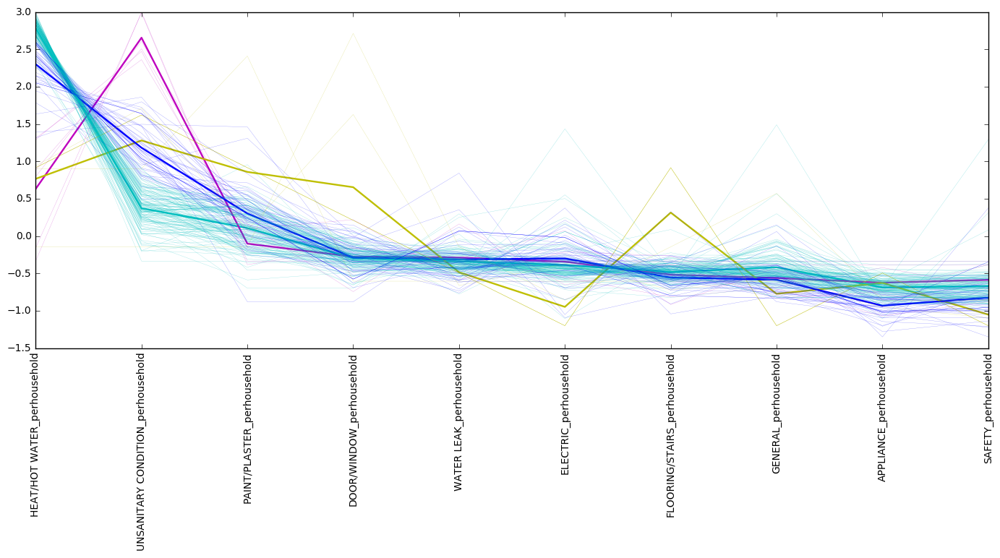

In [108]:
fig = plt.figure(figsize=(17, 6))
#plt.ylabel('#of Business in zipcode level (normalized)', fontsize=15)
#plt.xlabel('311 Complaints Types related to HPD', fontsize=15)
#plt.xlim(0,11)
#plt.ylim(-1,4)
plt.xticks(n_list_fake[0:10], n_list[0:10], rotation='vertical')

for i in range(len(group_Kc4_N)):
    plt.plot(n_list_fake,meancenter4[i], color=colors[i], linewidth=1.7)

for i in range(len(myarray_norm)):
    for n in range(4):
        if group_Kc4[i]==n:
            plt.plot(n_list_fake,myarray_norm[i], color=colors[n] , alpha=0.5, linewidth=0.2)

In [109]:
df_new['Cluster'] = group_Kc4
df_new['Cluster'] = df_new['Cluster'] + 1.0

In [110]:
df_cluster = pd.merge(df_zip, df_new, how='left', on=['HEAT/HOT WATER_perhousehold', 
                                                            'UNSANITARY CONDITION_perhousehold',
                                                            'PAINT/PLASTER_perhousehold', 'DOOR/WINDOW_perhousehold', 
                                                            'WATER LEAK_perhousehold', 'ELECTRIC_perhousehold', 
                                                            'FLOORING/STAIRS_perhousehold', 'GENERAL_perhousehold', 
                                                            'APPLIANCE_perhousehold', 'SAFETY_perhousehold'])

In [111]:
df_cluster = df_cluster.drop_duplicates('ZIPCODE')
df_cluster = df_cluster.loc[df_cluster['Cluster'] > 0]

In [112]:
df_cluster.Cluster.value_counts()

1.0    129
4.0     43
2.0      6
3.0      4
Name: Cluster, dtype: int64

In [113]:
c = mcolors.ColorConverter().to_rgb
cmyb = make_colormap([c('red'), c('yellow'),c('blue'), c('green')])

In [114]:
vmax = 3.0
cmap = LinearSegmentedColormap.from_list('mycmap', [(0 / vmax, 'c'),
                                                    (1 / vmax, 'm'),
                                                    (2 / vmax, 'y'),
                                                    (3 / vmax, 'b')]
                                        )

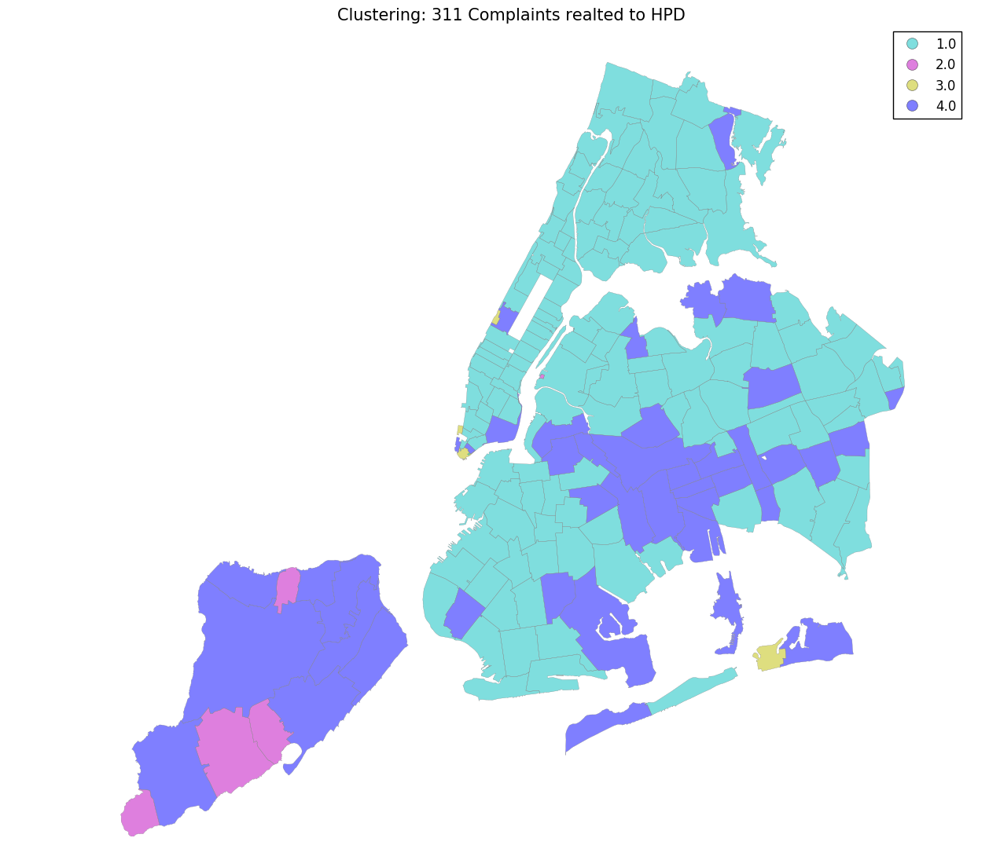

In [115]:
fig, ax = plt.subplots(figsize = (15,15))
ax.set_aspect('equal')
#zipcode.plot(ax = ax, color = 'white', alpha= 0.1, linewidth = 0.1)
df_cluster.plot(column = 'Cluster', ax = ax, categorical=True, cmap=cmap, legend=True,
                 edgecolor = 'Grey', linewidth = 0.2)
plt.axis('off')
plt.title('Clustering: 311 Complaints realted to HPD', size=15)

* when using whole annual data, regardless of neighborhoods, the most complaints are about HEAT/HOT WATER. 
* When applying same clustering method for only September 2016 data, the result looks different (there are much clearer neighborhood pattern regarding characteristics)
* Need to same process as dividing seasonal trend (winter season and summer season), because we can see different pattern between Apr-Sep and Oct-March.

In [116]:
df_zip.head()

,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,...,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
0,2.269930e+07,0,Queens,081,18682.0,Jamaica,0.0,0.0,NY,36,...,0.022601,0.015932,0.008892,0.005743,0.006113,0.006113,0.002408,0.004446,0.002594,0.000926
1,2.963100e+07,0,Kings,047,62427.0,Brooklyn,0.0,0.0,NY,36,...,0.174503,0.066658,0.057365,0.035652,0.035061,0.025683,0.026063,0.019347,0.006970,0.006294
2,4.197210e+07,0,Kings,047,83867.0,Brooklyn,0.0,0.0,NY,36,...,0.119790,0.050152,0.041060,0.026330,0.023332,0.019063,0.014729,0.016554,0.006746,0.005051
3,2.369863e+07,0,Kings,047,56528.0,Brooklyn,0.0,0.0,NY,36,...,0.174403,0.060504,0.065374,0.032336,0.034530,0.024702,0.028826,0.020621,0.008424,0.005879
4,3.686880e+07,0,Kings,047,72281.0,Brooklyn,0.0,0.0,NY,36,...,0.067496,0.025251,0.024486,0.012887,0.011035,0.008900,0.011397,0.006564,0.003705,0.002537


In [118]:
df_zip_clean.head()

,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,...,HEAT/HOT WATER_perhousehold,UNSANITARY CONDITION_perhousehold,PAINT/PLASTER_perhousehold,DOOR/WINDOW_perhousehold,WATER LEAK_perhousehold,ELECTRIC_perhousehold,FLOORING/STAIRS_perhousehold,GENERAL_perhousehold,APPLIANCE_perhousehold,SAFETY_perhousehold
0,2.269930e+07,0,Queens,081,18682.0,Jamaica,0.0,0.0,NY,36,...,0.022601,0.015932,0.008892,0.005743,0.006113,0.006113,0.002408,0.004446,0.002594,0.000926
2,4.197210e+07,0,Kings,047,83867.0,Brooklyn,0.0,0.0,NY,36,...,0.119790,0.050152,0.041060,0.026330,0.023332,0.019063,0.014729,0.016554,0.006746,0.005051
4,3.686880e+07,0,Kings,047,72281.0,Brooklyn,0.0,0.0,NY,36,...,0.067496,0.025251,0.024486,0.012887,0.011035,0.008900,0.011397,0.006564,0.003705,0.002537
6,4.200274e+07,0,Kings,047,92562.0,Brooklyn,0.0,0.0,NY,36,...,0.034006,0.014053,0.016082,0.009093,0.006651,0.006087,0.006501,0.003983,0.001804,0.001691
7,4.788702e+07,0,Kings,047,67068.0,Brooklyn,0.0,0.0,NY,36,...,0.092432,0.043637,0.042359,0.020951,0.021088,0.015063,0.015291,0.008810,0.005706,0.003697


In [119]:
#df_zip.to_csv('data/data_zip.csv')
#df_zip_clean.to_csv('data/data_zip_clean.csv')

In [120]:
df_zip.dtypes

AREA                                 float64
BLDGZIP                               object
COUNTY                                object
CTY_FIPS                              object
POPULATION                           float64
PO_NAME                               object
SHAPE_AREA                           float64
SHAPE_LEN                            float64
STATE                                 object
ST_FIPS                               object
URL                                   object
ZIPCODE                               object
geometry                              object
POP                                  float64
HOUSEHOLD                            float64
Com_Counts                           float64
ELEVATOR                             float64
UNSANITARY CONDITION                 float64
PLUMBING                             float64
PAINT/PLASTER                        float64
HPD Literature Request               float64
FLOORING/STAIRS                      float64
GENERAL   